In [1]:
import pandas as pd
import numpy as np
import pickle
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from ultimation import model_selection
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn import preprocessing
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNetCV, ElasticNet
from xgboost import XGBRegressor, plot_importance 
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold

In [2]:
data = pd.read_csv('train_boston latest.csv')
data

,index,id,data,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zip_code,lat,lon,sqft_living15,sqft_lot15,price
0,6243,8850000509,9/23/14,2,1.50,1620,1444,2.0,0,0,...,1080,540,2007,0,98144,47.5892,-122.309,1660,1642,525000
1,8986,191100410,6/20/14,3,2.75,2470,10125,2.0,0,0,...,2470,0,1960,2012,98040,47.5651,-122.223,2290,10125,970500
2,9419,6632300040,4/25/15,2,1.00,1140,7435,1.0,0,0,...,1140,0,1952,1990,98125,47.7300,-122.310,1320,9385,327000
3,10155,7517500310,5/6/15,3,1.00,1460,6198,1.5,0,0,...,1460,0,1916,0,98107,47.6626,-122.361,2280,5160,775000
4,10436,7454000990,9/24/14,2,1.00,670,6720,1.0,0,0,...,670,0,1942,0,98126,47.5151,-122.372,710,6720,304950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17271,11964,4353700200,12/3/14,2,1.75,1810,7523,1.0,0,0,...,1170,640,1962,1980,98027,47.5695,-122.087,2090,7523,501000
17272,21575,1931300412,4/16/15,3,2.25,1190,1200,3.0,0,0,...,1190,0,2008,0,98103,47.6542,-122.346,1180,1224,475000
17273,5390,9187200285,5/5/14,6,1.75,2920,5000,2.5,0,0,...,2780,140,1908,0,98122,47.6024,-122.295,2020,5000,823000
17274,860,2359300030,5/8/15,3,1.00,910,5212,1.0,0,0,...,910,0,1951,0,98115,47.6742,-122.284,1520,6300,565000


In [3]:
data.head()

,index,id,data,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zip_code,lat,lon,sqft_living15,sqft_lot15,price
0,6243,8850000509,9/23/14,2,1.50,1620,1444,2.0,0,0,...,1080,540,2007,0,98144,47.5892,-122.309,1660,1642,525000
1,8986,191100410,6/20/14,3,2.75,2470,10125,2.0,0,0,...,2470,0,1960,2012,98040,47.5651,-122.223,2290,10125,970500
2,9419,6632300040,4/25/15,2,1.00,1140,7435,1.0,0,0,...,1140,0,1952,1990,98125,47.7300,-122.310,1320,9385,327000
3,10155,7517500310,5/6/15,3,1.00,1460,6198,1.5,0,0,...,1460,0,1916,0,98107,47.6626,-122.361,2280,5160,775000
4,10436,7454000990,9/24/14,2,1.00,670,6720,1.0,0,0,...,670,0,1942,0,98126,47.5151,-122.372,710,6720,304950


In [4]:
data.columns.values

array(['index', ' id', ' data', ' bedrooms', ' bathrooms', ' sqft_living',
       ' sqft_lot', ' floors', ' waterfront', ' view', ' condition',
       ' grade', ' sqft_above', ' sqft_basement', ' yr_built',
       ' yr_renovated', ' zip_code', ' lat', ' lon', ' sqft_living15',
       ' sqft_lot15', ' price'], dtype=object)

In [5]:
# cleaning up the column names
data.columns = map(lambda x : x.strip(), data.columns)
data.columns

Index(['index', 'id', 'data', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zip_code',
       'lat', 'lon', 'sqft_living15', 'sqft_lot15', 'price'],
      dtype='object')

In [6]:
prices = data['price']
# TODO: Minimum price of the data
minimum_price = np.min(prices)
# Alternative using pandas
# minimum_price = prices.min()

# TODO: Maximum price of the data
maximum_price = np.max(prices)
# Alternative using pandas
# maximum_price = prices.max()

# TODO: Mean price of the data
mean_price = np.mean(prices)
# Alternative using pandas
# mean_price = prices.mean()

# TODO: Median price of the data
median_price = np.median(prices)
# Alternative using pandas
# median_price = prices.median()

# TODO: Standard deviation of prices of the data
std_price = np.std(prices)
# Alternative using pandas 
# std_price = prices.std(ddof=0)

# There are other statistics you can calculate too like quartiles
first_quartile = np.percentile(prices, 25)
third_quartile = np.percentile(prices, 75)
inter_quartile = third_quartile - first_quartile

# Show the calculated statistics
print("Statistics for Boston housing dataset:\n")
print("Minimum price: ${:,.2f}".format(minimum_price))
print("Maximum price: ${:,.2f}".format(maximum_price))
print("Mean price: ${:,.2f}".format(mean_price))
print("Median price ${:,.2f}".format(median_price))
print("Standard deviation of prices: ${:,.2f}".format(std_price))
print("First quartile of prices: ${:,.2f}".format(first_quartile))
print("Second quartile of prices: ${:,.2f}".format(third_quartile))
print("Interquartile (IQR) of prices: ${:,.2f}".format(inter_quartile))

Statistics for Boston housing dataset:

Minimum price: $80,000.00
Maximum price: $7,700,000.00
Mean price: $540,880.74
Median price $450,000.00
Standard deviation of prices: $373,250.33
First quartile of prices: $321,020.25
Second quartile of prices: $644,212.50
Interquartile (IQR) of prices: $323,192.25


In [7]:
data1 = data.copy()
data1.head()

,index,id,data,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zip_code,lat,lon,sqft_living15,sqft_lot15,price
0,6243,8850000509,9/23/14,2,1.50,1620,1444,2.0,0,0,...,1080,540,2007,0,98144,47.5892,-122.309,1660,1642,525000
1,8986,191100410,6/20/14,3,2.75,2470,10125,2.0,0,0,...,2470,0,1960,2012,98040,47.5651,-122.223,2290,10125,970500
2,9419,6632300040,4/25/15,2,1.00,1140,7435,1.0,0,0,...,1140,0,1952,1990,98125,47.7300,-122.310,1320,9385,327000
3,10155,7517500310,5/6/15,3,1.00,1460,6198,1.5,0,0,...,1460,0,1916,0,98107,47.6626,-122.361,2280,5160,775000
4,10436,7454000990,9/24/14,2,1.00,670,6720,1.0,0,0,...,670,0,1942,0,98126,47.5151,-122.372,710,6720,304950


In [8]:
# setting up the zip code column as categorical
data1['zip_code'] = data1['zip_code'].astype('category')

In [9]:
# extracting just the month from the data since it covers just one year
data1['data'] = pd.to_datetime(data1['data'])
data1['data'] = data1['data'].dt.month

In [10]:
data1['yr_renovated'] = data1['yr_renovated'].apply(lambda x: 1 if 0 < x < 2000 else 2 if x >= 2000 else 0)
data1['yr_renovated'].value_counts()

0    16550
2      368
1      358
Name: yr_renovated, dtype: int64

In [11]:
data2 = data1.copy()

In [12]:
data2['floors'] = data2['floors'].apply(lambda x: 1 if x < 2 else 2 if 2 <= x < 3 else 3)

In [13]:
data2['bathrooms'] = data2['bathrooms'].astype('category')
data2['bedrooms'] = data2['bedrooms'].astype('category')
data2['floors'] = data2['floors'].astype('category')
data2['view'] = data2['view'].astype('category')
data2['condition'] = data2['condition'].astype('category')
data2['grade'] = data2['grade'].astype('category')

In [14]:
data2 = data2.set_index('index', drop = True)
data2.head()

,id,data,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_above,sqft_basement,yr_built,yr_renovated,zip_code,lat,lon,sqft_living15,sqft_lot15,price
index,,,,,,,,,,,,,,,,,,,,,
6243,8850000509,9,2,1.50,1620,1444,2,0,0,3,...,1080,540,2007,0,98144,47.5892,-122.309,1660,1642,525000
8986,191100410,6,3,2.75,2470,10125,2,0,0,3,...,2470,0,1960,2,98040,47.5651,-122.223,2290,10125,970500
9419,6632300040,4,2,1.00,1140,7435,1,0,0,3,...,1140,0,1952,1,98125,47.7300,-122.310,1320,9385,327000
10155,7517500310,5,3,1.00,1460,6198,1,0,0,4,...,1460,0,1916,0,98107,47.6626,-122.361,2280,5160,775000
10436,7454000990,9,2,1.00,670,6720,1,0,0,5,...,670,0,1942,0,98126,47.5151,-122.372,710,6720,304950


In [15]:
data3 = data2.copy()
data3['basement'] = data3['sqft_basement'].apply(lambda x: 1 if 0 < x else 0)
data3['basement'].value_counts()

0    10482
1     6794
Name: basement, dtype: int64

In [16]:
data3.head()

,id,data,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zip_code,lat,lon,sqft_living15,sqft_lot15,price,basement
index,,,,,,,,,,,,,,,,,,,,,
6243,8850000509,9,2,1.50,1620,1444,2,0,0,3,...,540,2007,0,98144,47.5892,-122.309,1660,1642,525000,1
8986,191100410,6,3,2.75,2470,10125,2,0,0,3,...,0,1960,2,98040,47.5651,-122.223,2290,10125,970500,0
9419,6632300040,4,2,1.00,1140,7435,1,0,0,3,...,0,1952,1,98125,47.7300,-122.310,1320,9385,327000,0
10155,7517500310,5,3,1.00,1460,6198,1,0,0,4,...,0,1916,0,98107,47.6626,-122.361,2280,5160,775000,0
10436,7454000990,9,2,1.00,670,6720,1,0,0,5,...,0,1942,0,98126,47.5151,-122.372,710,6720,304950,0


In [17]:
df1 = data3[data3['price'] < 550000]
df2 = data3[data3['price'] >= 550000]

In [18]:
df1.head()

,id,data,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zip_code,lat,lon,sqft_living15,sqft_lot15,price,basement
index,,,,,,,,,,,,,,,,,,,,,
6243,8850000509,9,2,1.50,1620,1444,2,0,0,3,...,540,2007,0,98144,47.5892,-122.309,1660,1642,525000,1
9419,6632300040,4,2,1.00,1140,7435,1,0,0,3,...,0,1952,1,98125,47.7300,-122.310,1320,9385,327000,0
10436,7454000990,9,2,1.00,670,6720,1,0,0,5,...,0,1942,0,98126,47.5151,-122.372,710,6720,304950,0
7944,7300000650,7,4,2.50,1954,4805,2,0,0,3,...,0,2005,0,98055,47.4297,-122.190,1714,3259,340000,0
15141,6669020290,10,3,1.75,1720,9775,1,0,0,3,...,0,1978,0,98032,47.3731,-122.286,1970,8400,169000,0


In [19]:
df2.head()

,id,data,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zip_code,lat,lon,sqft_living15,sqft_lot15,price,basement
index,,,,,,,,,,,,,,,,,,,,,
8986,191100410,6,3,2.75,2470,10125,2,0,0,3,...,0,1960,2,98040,47.5651,-122.223,2290,10125,970500,0
10155,7517500310,5,3,1.00,1460,6198,1,0,0,4,...,0,1916,0,98107,47.6626,-122.361,2280,5160,775000,0
13701,6909200355,4,5,3.50,2880,3750,2,0,2,3,...,610,2001,0,98144,47.5905,-122.292,2060,4000,830000,1
2154,2095800520,4,3,2.50,2250,7752,2,0,0,4,...,0,1988,0,98011,47.7489,-122.185,2080,7033,550000,0
13257,2524049318,5,4,3.00,4260,18000,2,0,2,3,...,0,2000,0,98040,47.5355,-122.240,3540,17015,2000000,0


In [20]:
df1.describe()

,id,data,sqft_living,sqft_lot,waterfront,sqft_above,sqft_basement,yr_built,yr_renovated,lat,lon,sqft_living15,sqft_lot15,price,basement
count,1.113400e+04,11134.000000,11134.000000,1.113400e+04,11134.000000,11134.000000,11134.000000,11134.000000,11134.000000,11134.000000,11134.000000,11134.000000,11134.000000,11134.000000,11134.000000
mean,4.561606e+09,6.601311,1702.226962,1.221344e+04,0.001527,1487.876415,214.350548,1970.495509,0.041944,47.526893,-122.220462,1724.921771,10987.184749,358362.056853,0.339501
std,2.850793e+09,3.152566,596.367552,2.950571e+04,0.039047,553.872991,354.469278,27.648552,0.257016,0.151803,0.140581,468.835146,21758.355533,103191.832162,0.473561
min,1.000102e+06,1.000000,370.000000,5.720000e+02,0.000000,370.000000,0.000000,1900.000000,0.000000,47.155900,-122.512000,460.000000,651.000000,80000.000000,0.000000
25%,2.123212e+09,4.000000,1260.000000,5.015000e+03,0.000000,1090.000000,0.000000,1952.000000,0.000000,47.390400,-122.331750,1380.000000,5111.000000,276000.000000,0.000000
50%,3.889350e+09,6.000000,1630.000000,7.480000e+03,0.000000,1360.000000,0.000000,1971.000000,0.000000,47.522650,-122.257000,1650.000000,7520.000000,355000.000000,0.000000
75%,7.276100e+09,9.000000,2070.000000,9.775000e+03,0.000000,1780.000000,400.000000,1993.000000,0.000000,47.677500,-122.146000,2010.000000,9520.000000,440000.000000,1.000000
max,9.900000e+09,12.000000,5461.000000,1.164794e+06,1.000000,4190.000000,2196.000000,2015.000000,2.000000,47.777600,-121.315000,4362.000000,438213.000000,549995.000000,1.000000


In [21]:
df2.describe()

,id,data,sqft_living,sqft_lot,waterfront,sqft_above,sqft_basement,yr_built,yr_renovated,lat,lon,sqft_living15,sqft_lot15,price,basement
count,6.142000e+03,6142.000000,6142.000000,6.142000e+03,6142.000000,6142.000000,6142.000000,6142.000000,6142.000000,6142.000000,6142.000000,6142.000000,6142.000000,6.142000e+03,6142.000000
mean,4.617760e+09,6.490231,2776.411104,2.029381e+04,0.018724,2340.642299,435.768805,1972.482091,0.102084,47.618938,-122.203796,2465.224683,15661.446923,8.717442e+05,0.490720
std,2.939190e+09,3.050327,1008.177699,5.672658e+04,0.135558,957.779335,547.653489,32.144736,0.405746,0.082621,0.139653,761.098509,31637.973415,4.502606e+05,0.499955
min,1.200019e+06,1.000000,720.000000,5.200000e+02,0.000000,580.000000,0.000000,1900.000000,0.000000,47.159300,-122.519000,860.000000,958.000000,5.500000e+05,0.000000
25%,2.025069e+09,4.000000,2090.000000,5.067750e+03,0.000000,1600.000000,0.000000,1950.250000,0.000000,47.568600,-122.323000,1880.000000,5007.000000,6.250000e+05,0.000000
50%,3.959400e+09,6.000000,2640.000000,8.102000e+03,0.000000,2190.000000,0.000000,1979.000000,0.000000,47.630450,-122.209000,2380.000000,8000.000000,7.350000e+05,0.000000
75%,7.504021e+09,9.000000,3300.000000,1.358425e+04,0.000000,2940.000000,830.000000,2001.000000,0.000000,47.677200,-122.102000,2950.000000,12247.500000,9.200000e+05,1.000000
max,9.839301e+09,12.000000,13540.000000,1.651359e+06,1.000000,9410.000000,4820.000000,2015.000000,2.000000,47.777600,-121.691000,6210.000000,560617.000000,7.700000e+06,1.000000


In [22]:
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
model_list = [LinearRegression(), KNeighborsRegressor(n_neighbors=3, n_jobs=10), KNeighborsRegressor(n_neighbors=5, n_jobs=10), KNeighborsRegressor(n_neighbors=7, n_jobs=10), MLPRegressor(hidden_layer_sizes=(100,), alpha=0.0001, learning_rate_init=0.001, random_state=42), RandomForestRegressor(), XGBRegressor(n_estimators = 1000), XGBRegressor()]

In [23]:
def funky_function4_1_2(data, model_list):
    X = pd.get_dummies(data.drop('price', axis=1))
    y = data['price']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
    scaler = StandardScaler()
    scaler.fit(X_train)
    X_train, X_test = (scaler.transform(X_train), scaler.transform(X_test))
    results = {}
    results_mae = {}
    results_mse = {}
    for model in model_list:
        model.fit(X_train, y_train)
        results[model] = model.score(X_test, y_test)
        print(model, 'R2 score:', model.score(X_test, y_test))
        y_pred = model.predict(X_test)
        results2 = mean_absolute_error(y_test, y_pred)
        results3 = mean_squared_error(y_test, y_pred, squared=False)
        print('Mean Absolute Error:', results2)
        print('Mean Squared Error:', results3)
        results_mae[model] = results2
        results_mse[model] = results3
        plt.figure(figsize=(10,8))
        sns.regplot(x=y_pred, y=y_test, line_kws={"color": "orange"})
        plt.xlabel('Actual Values ')
        plt.ylabel('Predictions ')
        plt.title('Linear Model Predictions vs Actual')
        plt.show()
    final_result_r2 = max(results.values())
    final_result_mae = min(results_mae.values())
    final_result_mse = min(results_mse.values())
    print("--------------------------------------------------------------------------------------------------------")     
    print('TAA DAAA!! AND THE WINNER IIIISSSSS:')
    print("--------------------------------------------------------------------------------------------------------")
    print('Best R2:', model, final_result_r2)
    print('Best Mean Absolute Error:', model, final_result_mae)
    print('Best Mean Squared Error:', model, final_result_mse)
    print("--------------------------------------------------------------------------------------------------------")
    print('Fancy plotting incoming:')
    plt.figure(figsize=(10,8))
    sns.regplot(x=model.predict(X_test), y=y_test, line_kws={"color": "purple"})
    plt.xlabel('Actual Values ')
    plt.ylabel('Predictions ')
    plt.title('Linear Model Predictions vs Actual')
    plt.show()
    return max(results, key=results.get)
    return min(results_mae, key=results_mae.get)

LinearRegression() R2 score: -3.07823834339824e+22
Mean Absolute Error: 402027269655015.75
Mean Squared Error: 1.8183943466717876e+16


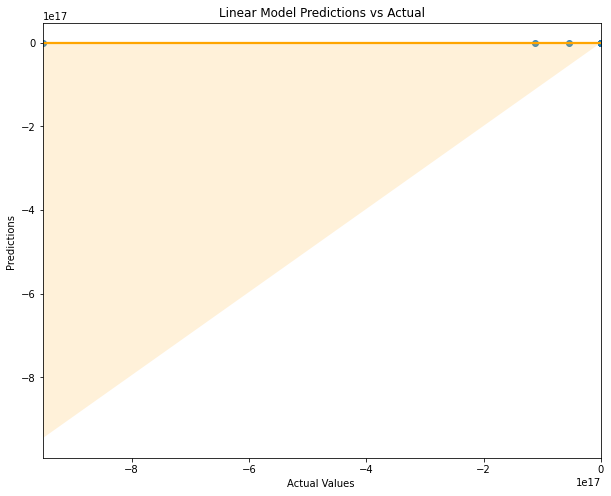

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.6277218039203937
Mean Absolute Error: 47541.12464080459
Mean Squared Error: 63236.92611373119


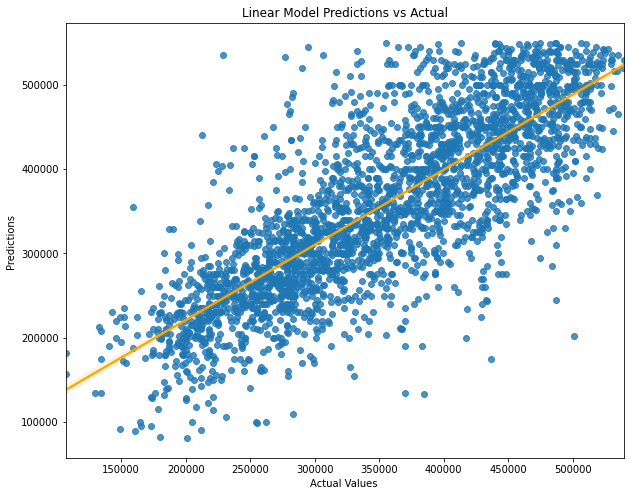

KNeighborsRegressor(n_jobs=10) R2 score: 0.6590863813673987
Mean Absolute Error: 45412.37456896552
Mean Squared Error: 60514.454952315595


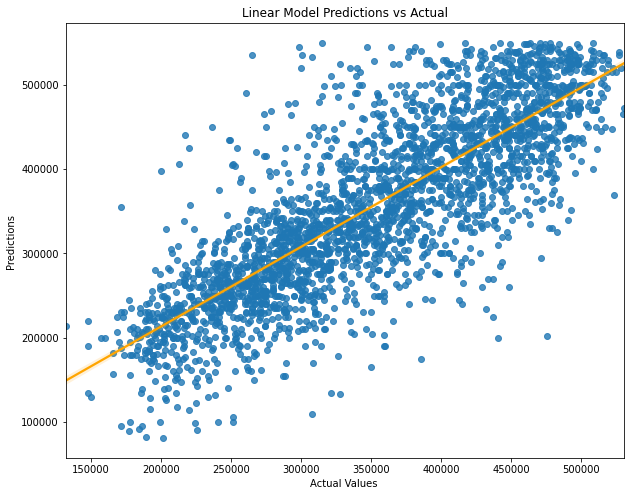

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.6680513060345425
Mean Absolute Error: 44981.35467980296
Mean Squared Error: 59713.48701262493


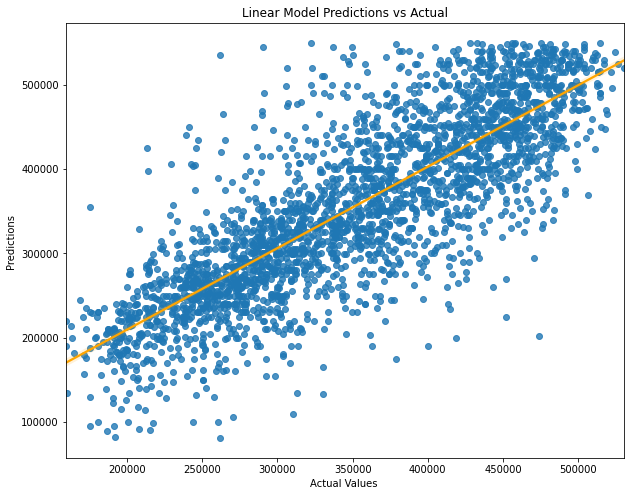

MLPRegressor(random_state=42) R2 score: -8.189082679464528
Mean Absolute Error: 301201.9630507662
Mean Squared Error: 314176.0175163121


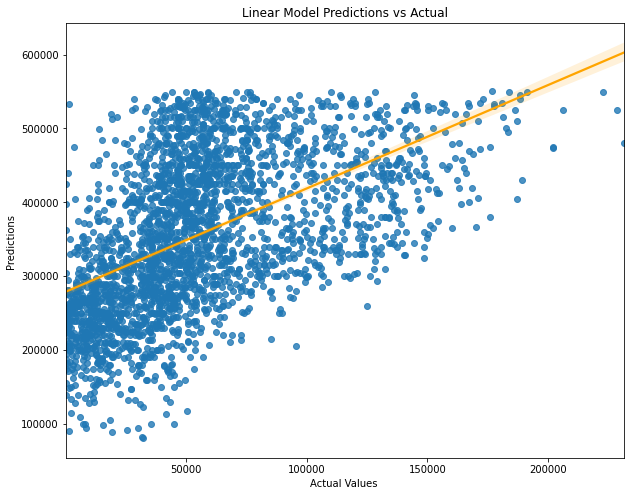

RandomForestRegressor() R2 score: 0.7482800357756434
Mean Absolute Error: 38001.6298204023
Mean Squared Error: 51999.09454831151


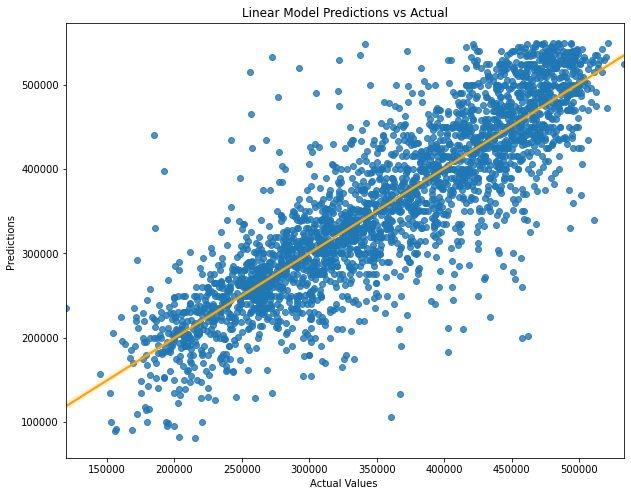

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.7525903381842349
Mean Absolute Error: 37726.90481321839
Mean Squared Error: 51551.97148881482


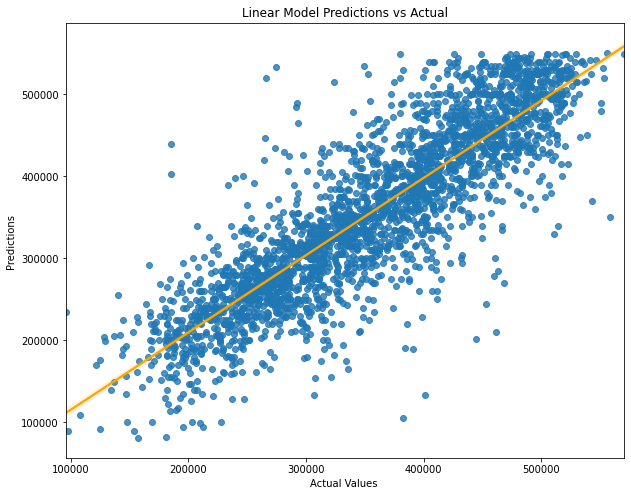

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.7681839779809126
Mean Absolute Error: 36892.00803980334
Mean Squared Error: 49900.934093731186


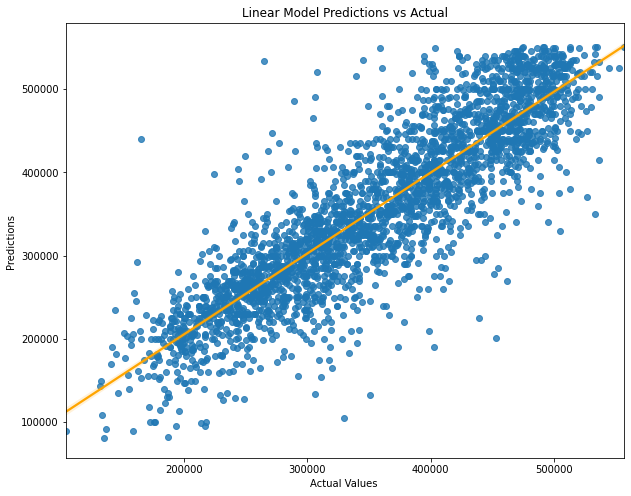

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.7681839779809126
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gam

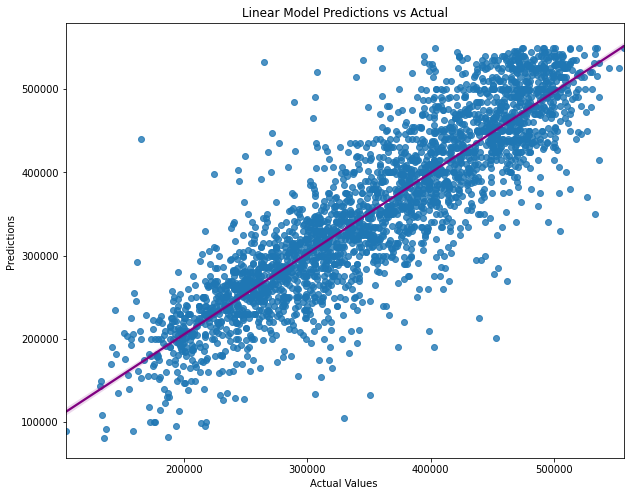

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [24]:
funky_function4_1_2(df1, model_list)

LinearRegression() R2 score: -4.613578426361346e+22
Mean Absolute Error: 2469591880838278.0
Mean Squared Error: 9.678783968984315e+16


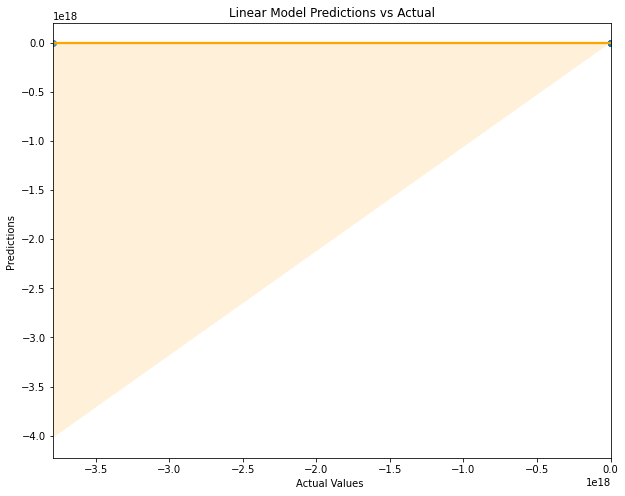

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.5573932393682108
Mean Absolute Error: 159032.6072048611
Mean Squared Error: 299785.66652608855


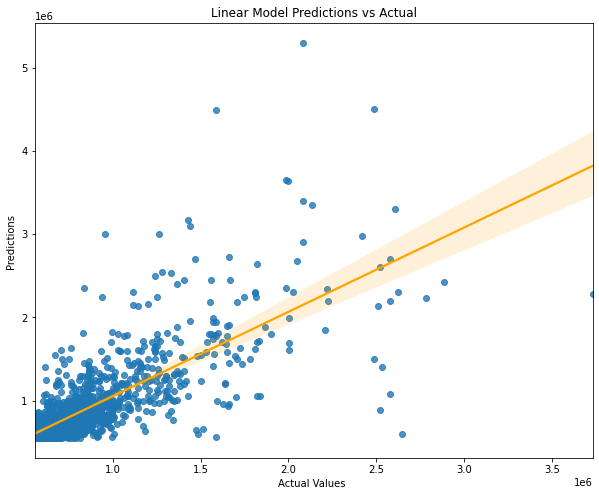

KNeighborsRegressor(n_jobs=10) R2 score: 0.5902242758842919
Mean Absolute Error: 153507.31497395833
Mean Squared Error: 288452.93077836774


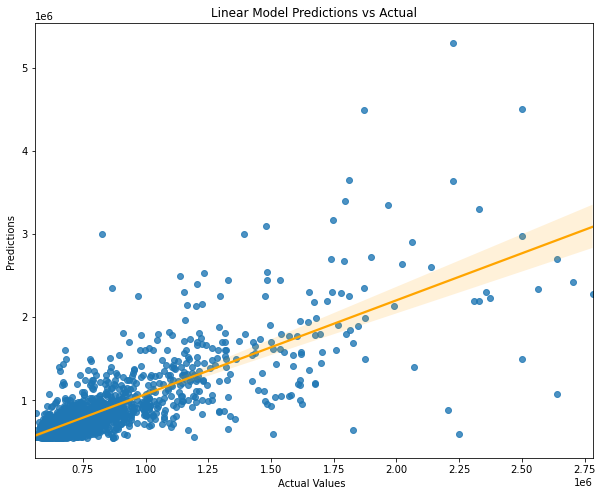

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.5716988867516866
Mean Absolute Error: 155012.8404017857
Mean Squared Error: 294901.135175547


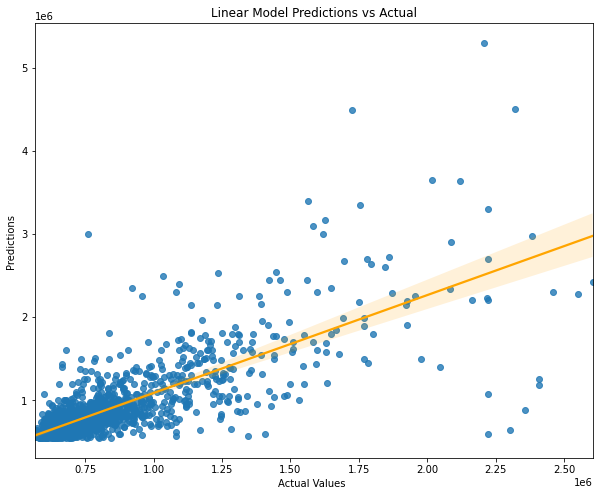

MLPRegressor(random_state=42) R2 score: -3.6699245165061454
Mean Absolute Error: 869184.6426637584
Mean Squared Error: 973770.8575455424


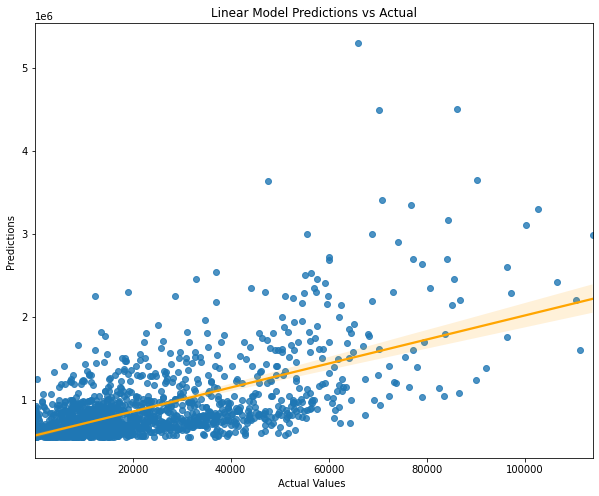

RandomForestRegressor() R2 score: 0.7452448949235868
Mean Absolute Error: 123247.27602213541
Mean Squared Error: 227438.1376458824


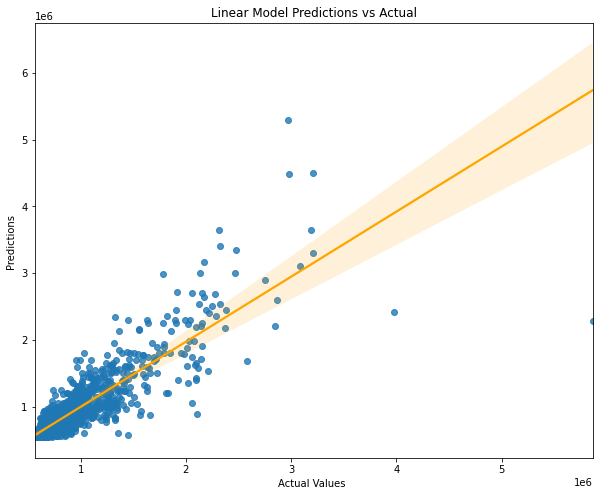

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.7675639331281636
Mean Absolute Error: 116821.69643147786
Mean Squared Error: 217246.90684096108


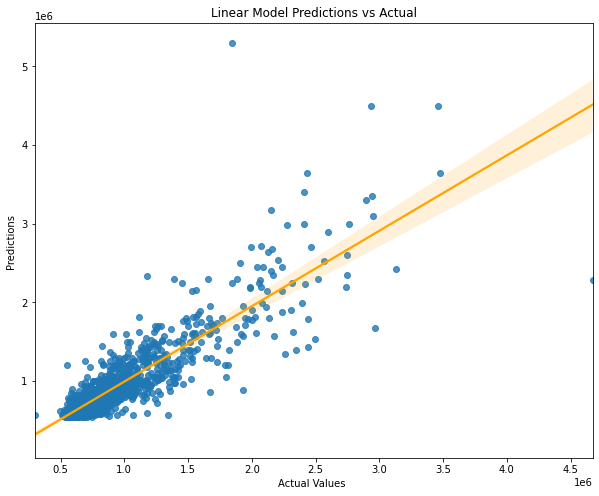

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.7683617161002714
Mean Absolute Error: 116491.65384928386
Mean Squared Error: 216873.76153313534


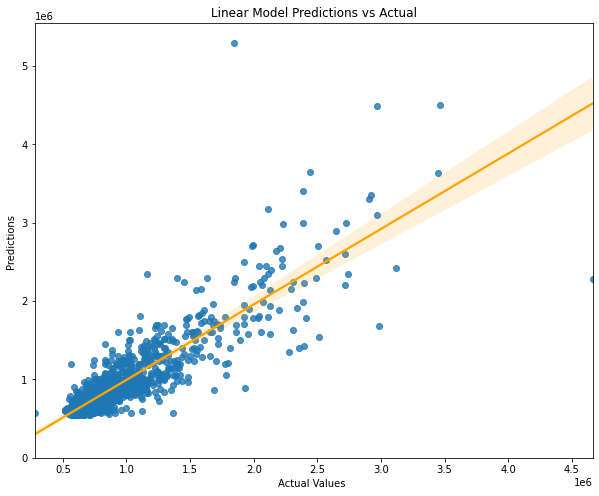

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.7683617161002714
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gam

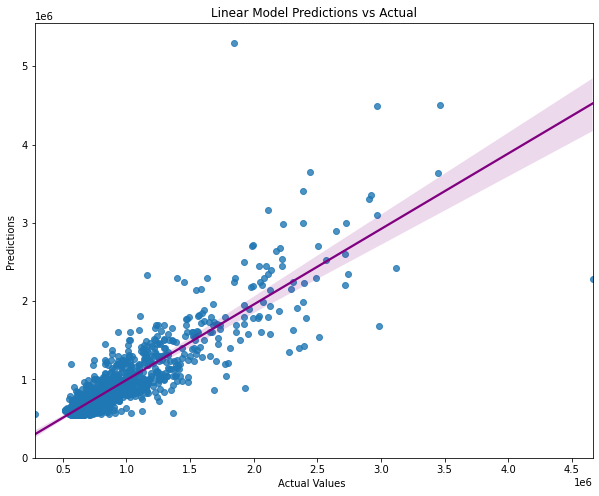

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [25]:
funky_function4_1_2(df2, model_list)

In [26]:
def remove_outliers(df, threshold=1.5, in_columns=[], skip_columns=[]):
    
    if len(in_columns) == 0:
        in_columns = df.select_dtypes(np.number).columns
        
    for column in in_columns:
        if column not in skip_columns:
            print(column)
            upper = np.percentile(df[column],75)
            lower = np.percentile(df[column],25)
            iqr = upper - lower
            upper_limit = upper + threshold * iqr
            lower_limit = lower - threshold * iqr
            print(upper_limit, lower_limit)
            df = df[(df[column]>lower_limit) & (df[column]<upper_limit)]
            print(len(df))
    return df

In [27]:
df2.columns

Index(['id', 'data', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zip_code', 'lat', 'lon',
       'sqft_living15', 'sqft_lot15', 'price', 'basement'],
      dtype='object')

In [28]:
df2['bedrooms'] = df2['bedrooms'].astype(int)

In [29]:
df2.dtypes

id                  int64
data                int64
bedrooms            int64
bathrooms        category
sqft_living         int64
sqft_lot            int64
floors           category
waterfront          int64
view             category
condition        category
grade            category
sqft_above          int64
sqft_basement       int64
yr_built            int64
yr_renovated        int64
zip_code         category
lat               float64
lon               float64
sqft_living15       int64
sqft_lot15          int64
price               int64
basement            int64
dtype: object

In [30]:
data4wo = remove_outliers(df2, threshold=1.5, in_columns=['bedrooms', 'sqft_living',
       'sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15', 'price'], skip_columns=['index', 'id', 'data', 'bathrooms', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'yr_built', 'yr_renovated', 'zip_code', 'lat', 'lon', 'basement'])

bedrooms
5.5 1.5
5955
sqft_living
5055.0 295.0
5822
sqft_lot
25305.0 -7183.0
5071
sqft_above
4598.75 -311.25
5053
sqft_basement
2025.0 -1215.0
5039
sqft_living15
4385.0 265.0
5006
sqft_lot15
17546.875 -2716.125
4803
price
1257500.0 237500.0
4397


In [31]:
df2['bedrooms'] = df2['bedrooms'].astype('category')

LinearRegression() R2 score: -3.5410583462173766e+22
Mean Absolute Error: 2163579093463211.2
Mean Squared Error: 8.479463674850747e+16


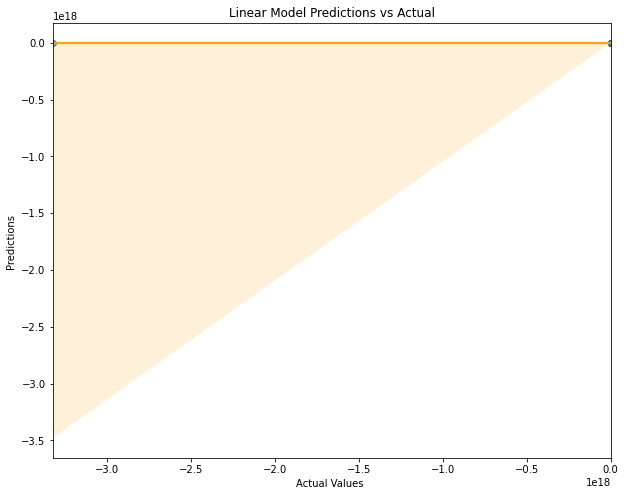

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.5573932393682108
Mean Absolute Error: 159032.6072048611
Mean Squared Error: 299785.66652608855


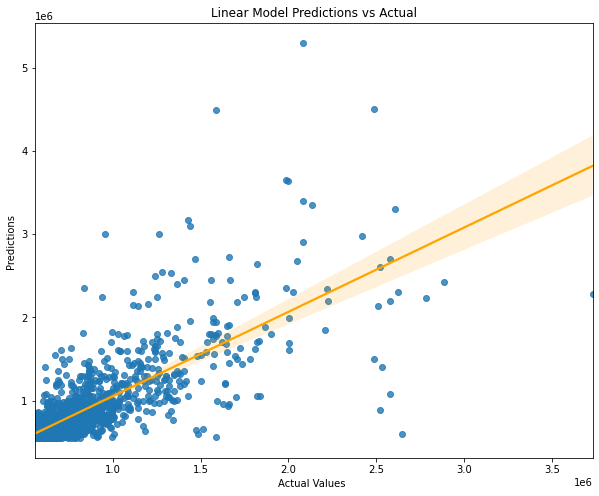

KNeighborsRegressor(n_jobs=10) R2 score: 0.5902242758842919
Mean Absolute Error: 153507.31497395833
Mean Squared Error: 288452.93077836774


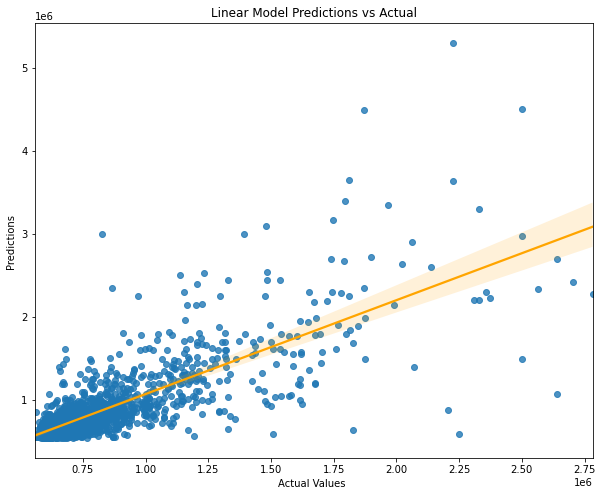

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.5716988867516866
Mean Absolute Error: 155012.8404017857
Mean Squared Error: 294901.135175547


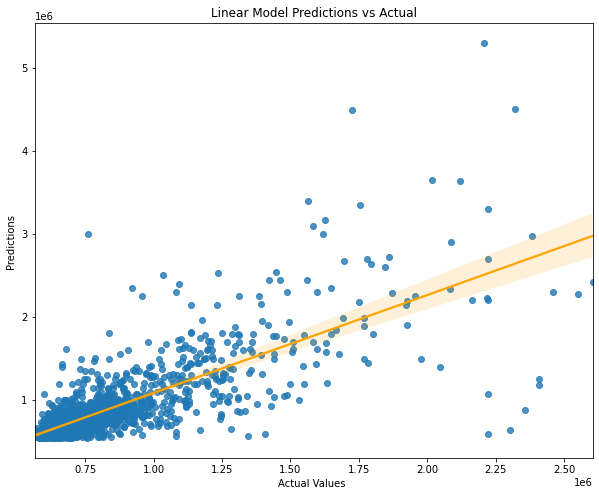

MLPRegressor(random_state=42) R2 score: -3.655169236292716
Mean Absolute Error: 867742.8884056382
Mean Squared Error: 972231.2577709144


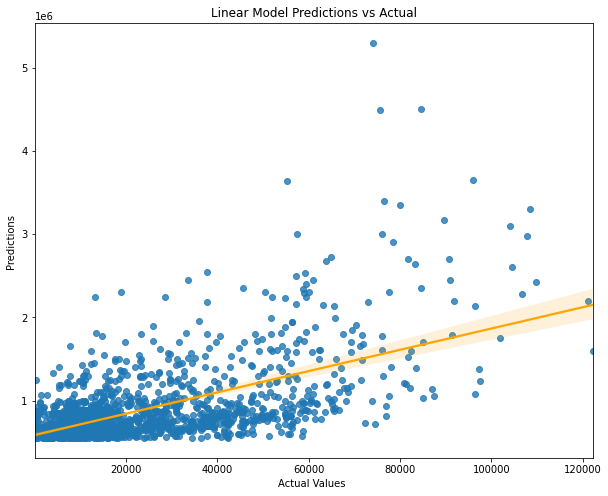

RandomForestRegressor() R2 score: 0.7483051721697993
Mean Absolute Error: 123199.8955078125
Mean Squared Error: 226067.94591782207


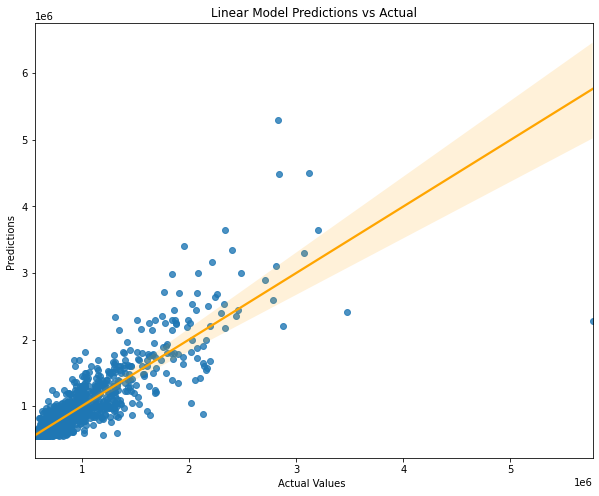

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.7675639331281636
Mean Absolute Error: 116821.69643147786
Mean Squared Error: 217246.90684096108


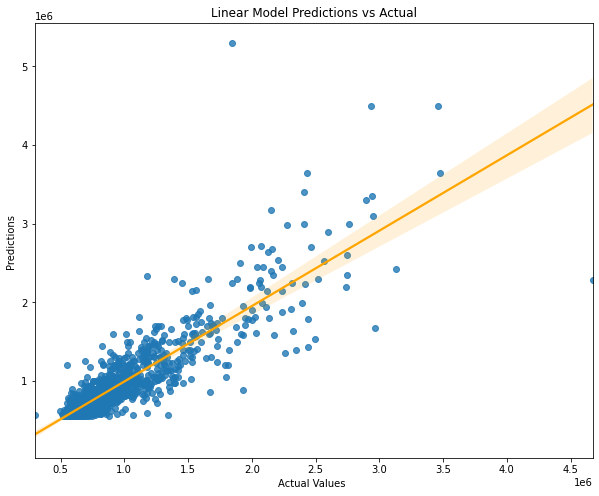

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.7683617161002714
Mean Absolute Error: 116491.65384928386
Mean Squared Error: 216873.76153313534


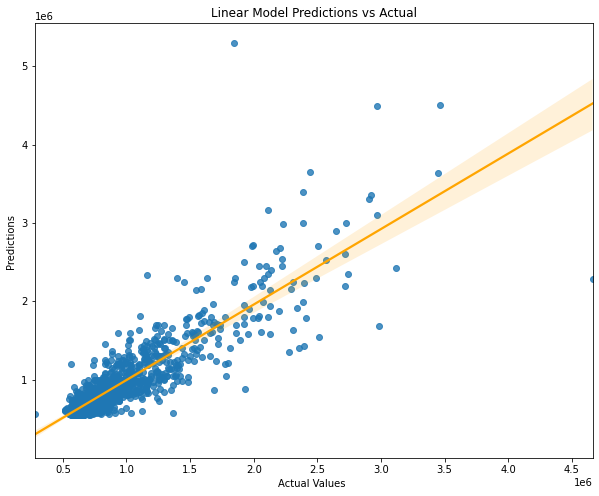

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.7683617161002714
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gam

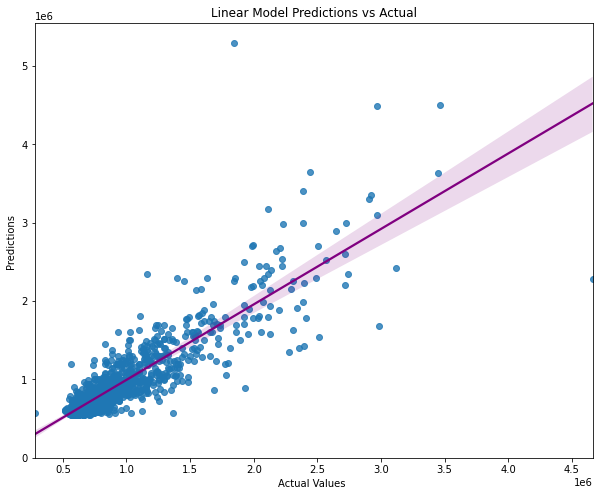

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [32]:
funky_function4_1_2(df2, model_list)

In [33]:
data3.dtypes

id                  int64
data                int64
bedrooms         category
bathrooms        category
sqft_living         int64
sqft_lot            int64
floors           category
waterfront          int64
view             category
condition        category
grade            category
sqft_above          int64
sqft_basement       int64
yr_built            int64
yr_renovated        int64
zip_code         category
lat               float64
lon               float64
sqft_living15       int64
sqft_lot15          int64
price               int64
basement            int64
dtype: object

In [34]:
data3['bedrooms'] = data3['bedrooms'].astype(int)

In [35]:
data3['bedrooms'].value_counts()

3     7771
4     5572
2     2212
5     1302
6      216
1      151
7       33
8       10
9        5
10       2
33       1
11       1
Name: bedrooms, dtype: int64

In [36]:
data3wo = remove_outliers(data3, threshold=1.5, in_columns=['bedrooms', 'sqft_living',
       'sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15', 'price'], skip_columns=['index', 'id', 'data', 'bathrooms', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'yr_built', 'yr_renovated', 'zip_code', 'lat', 'lon', 'basement'])

bedrooms
5.5 1.5
16857
sqft_living
4205.0 -235.0
16419
sqft_lot
18375.0 -3025.0
14647
sqft_above
3377.5 -170.5
14311
sqft_basement
1325.0 -795.0
14053
sqft_living15
3265.0 345.0
13833
sqft_lot15
14795.0 -1197.0
13485
price
980000.0 -100000.0
13053


In [37]:
data3wo['bedrooms'].value_counts()

3    6463
4    3872
2    1997
5     721
Name: bedrooms, dtype: int64

In [38]:
data3wo['bedrooms'] = data3wo['bedrooms'].astype('category')

In [39]:
data3wo.corr()['price'].sort_values(ascending=False)

price            1.000000
sqft_living      0.522120
lat              0.487716
sqft_living15    0.450698
sqft_above       0.402592
sqft_basement    0.231057
basement         0.196667
yr_renovated     0.102649
waterfront       0.052826
id               0.043808
lon             -0.005027
data            -0.014290
yr_built        -0.025051
sqft_lot        -0.084871
sqft_lot15      -0.100564
Name: price, dtype: float64

In [40]:
data_to_test = data3wo.drop(['id', 'lon', 'data', 'yr_built', 'sqft_lot', 'sqft_lot'], axis = 1)

LinearRegression() R2 score: 0.8137577487627279
Mean Absolute Error: 55617.64851173433
Mean Squared Error: 76028.09110657584


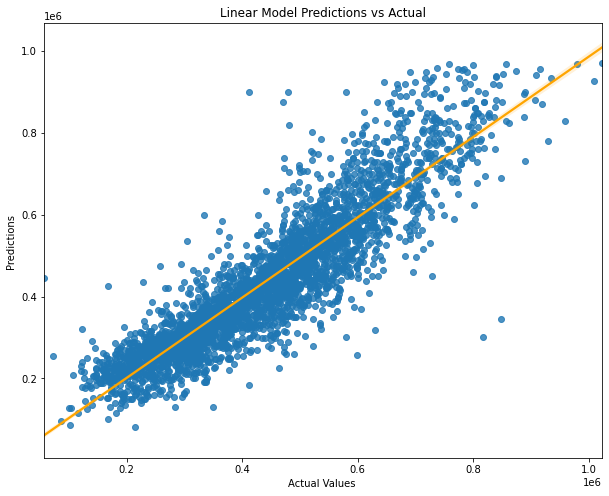

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.7248320328574251
Mean Absolute Error: 64817.37816584967
Mean Squared Error: 92413.18063852796


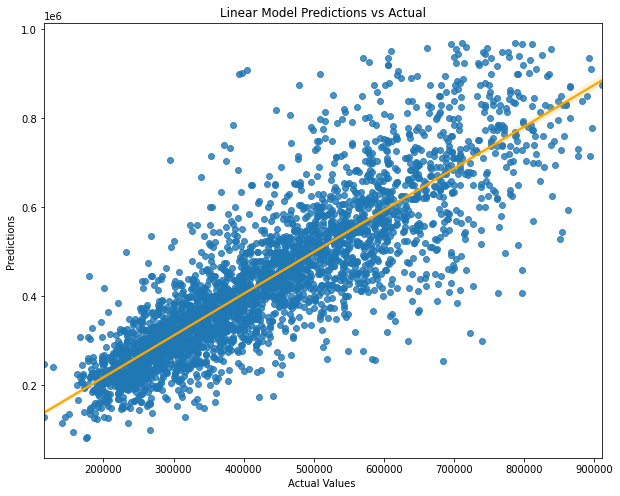

KNeighborsRegressor(n_jobs=10) R2 score: 0.7435669168196125
Mean Absolute Error: 62135.99736519608
Mean Squared Error: 89211.73942334308


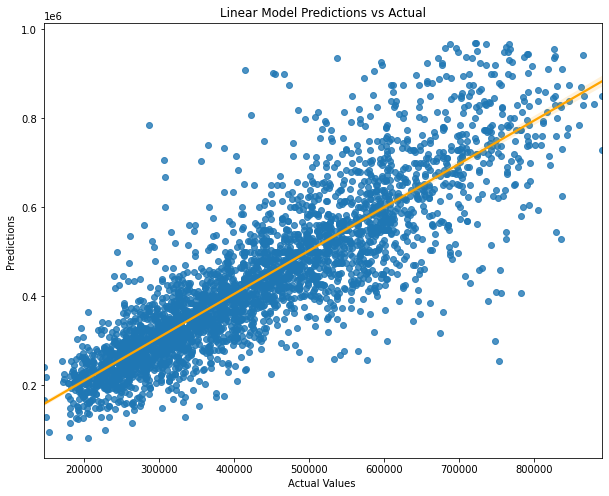

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.7514563788086105
Mean Absolute Error: 61461.372855392154
Mean Squared Error: 87828.66690891572


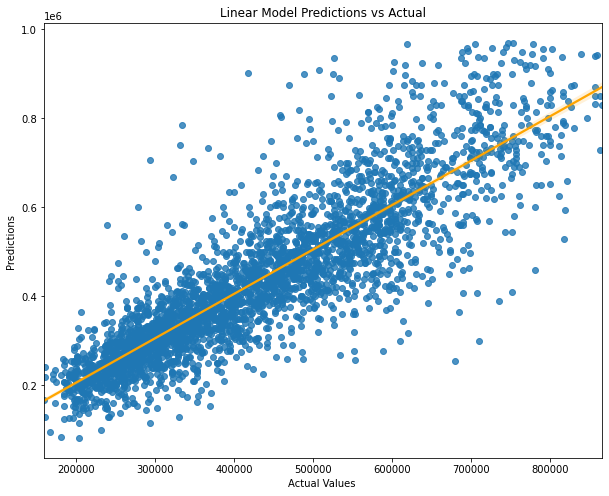

MLPRegressor(random_state=42) R2 score: -3.8712850505542784
Mean Absolute Error: 364972.04910647986
Mean Squared Error: 388827.30214111484


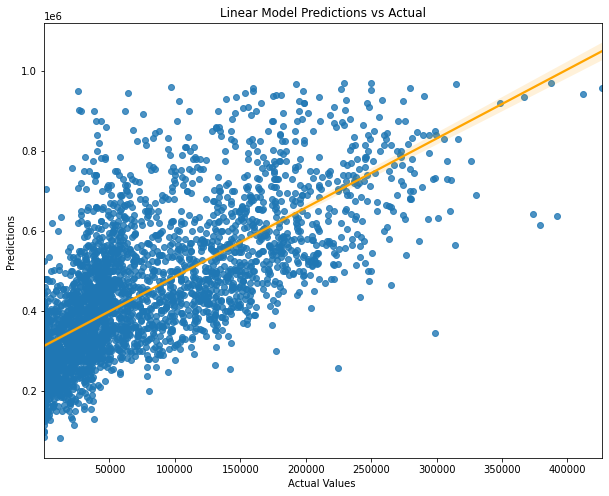

RandomForestRegressor() R2 score: 0.8209698691878854
Mean Absolute Error: 51776.412335317465
Mean Squared Error: 74541.48572623623


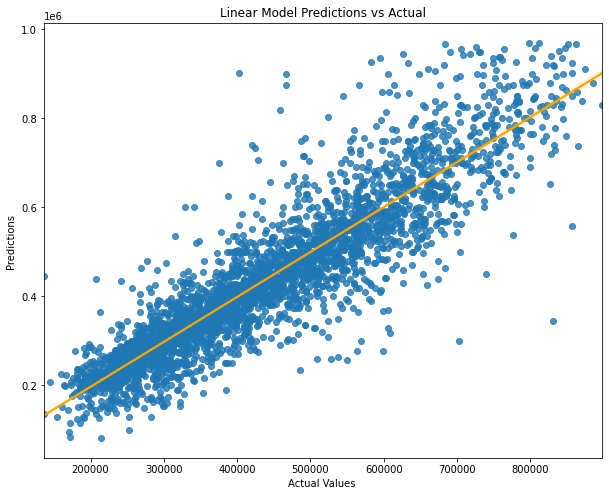

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.8180857636031988
Mean Absolute Error: 52375.83264878217
Mean Squared Error: 75139.50402009045


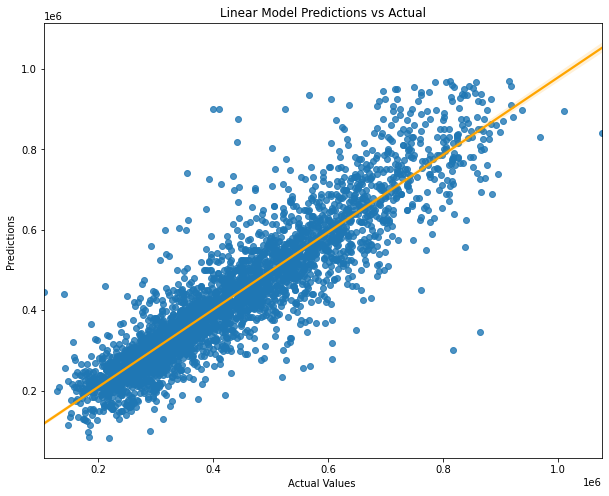

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.8331213538593026
Mean Absolute Error: 50470.36769732307
Mean Squared Error: 71967.32559929021


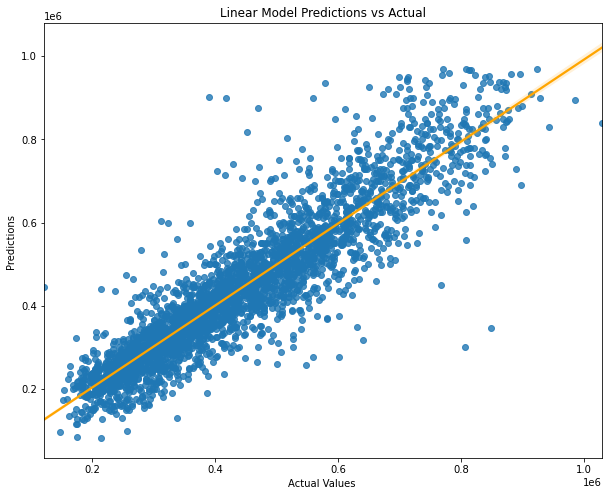

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.8331213538593026
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gam

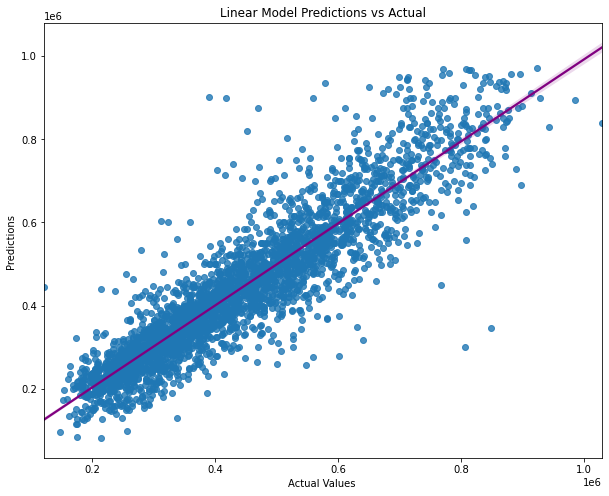

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [41]:
funky_function4_1_2(data_to_test, model_list)

In [42]:
data_to_test = data3wo.drop(['id', 'lat', 'id', 'yr_built', 'sqft_lot', 'sqft_lot15', 'yr_renovated', 'view'], axis = 1)

In [75]:
data_to_test.columns

Index(['bedrooms', 'bathrooms', 'sqft_living', 'floors', 'waterfront', 'view',
       'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_renovated',
       'zip_code', 'lat', 'sqft_living15', 'sqft_lot15', 'price', 'basement'],
      dtype='object')

LinearRegression() R2 score: 0.8071782121834759
Mean Absolute Error: 56592.689281947794
Mean Squared Error: 77359.389329682


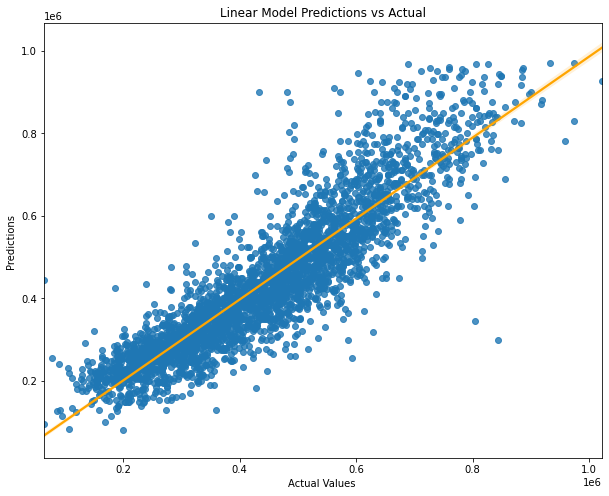

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.7194969627335568
Mean Absolute Error: 65469.474571078434
Mean Squared Error: 93304.7522901488


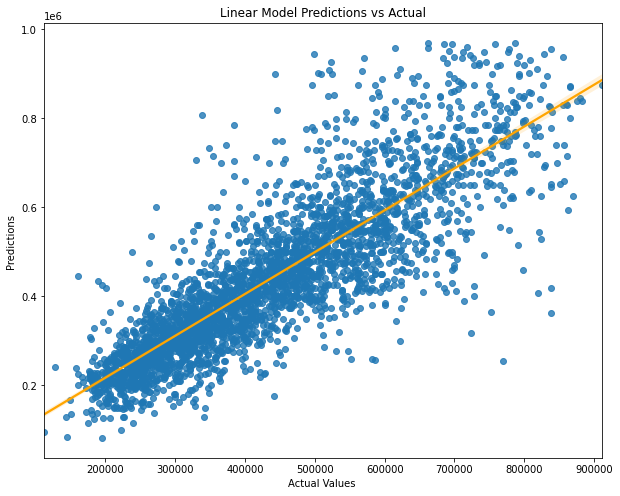

KNeighborsRegressor(n_jobs=10) R2 score: 0.7443084469624448
Mean Absolute Error: 62525.64601715686
Mean Squared Error: 89082.65879479719


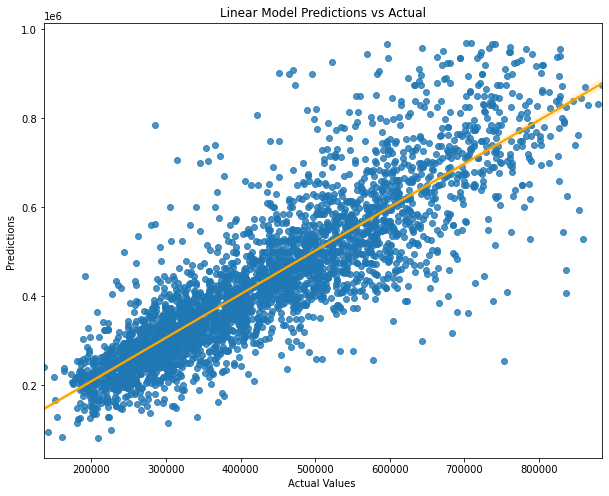

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.7497728193402025
Mean Absolute Error: 61968.243916316525
Mean Squared Error: 88125.62731710818


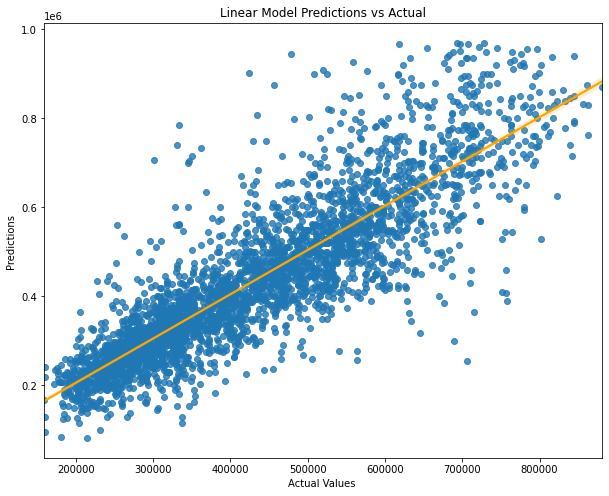

MLPRegressor(random_state=42) R2 score: -4.162397309078671
Mean Absolute Error: 373199.1773526138
Mean Squared Error: 400277.0524006232


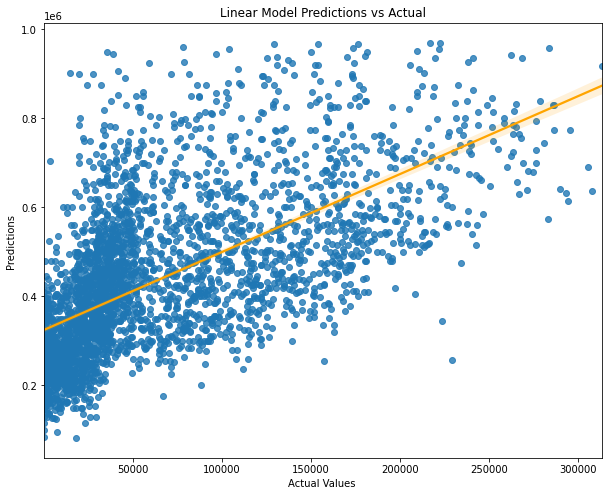

RandomForestRegressor() R2 score: 0.7951537235633447
Mean Absolute Error: 56003.04128170227
Mean Squared Error: 79735.00341820509


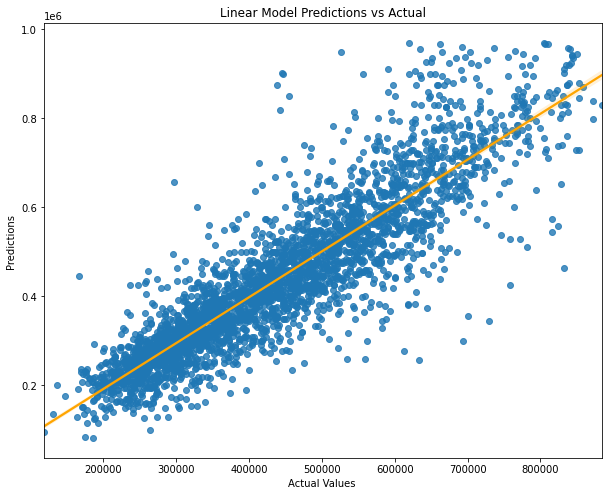

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.8095100581617045
Mean Absolute Error: 54376.442251168046
Mean Squared Error: 76890.20251587036


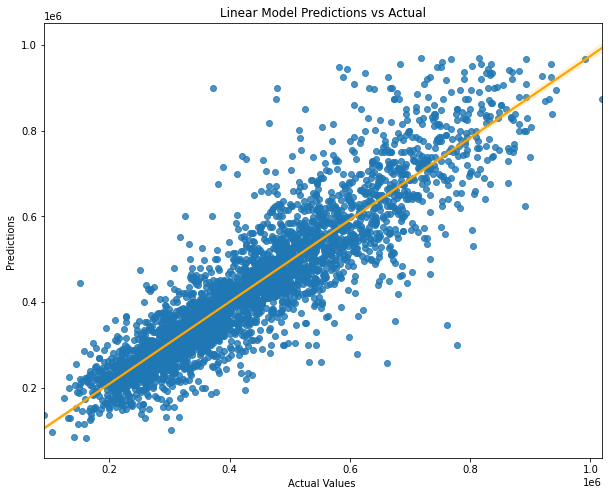

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.8190987699521978
Mean Absolute Error: 53084.35166542203
Mean Squared Error: 74930.00129485845


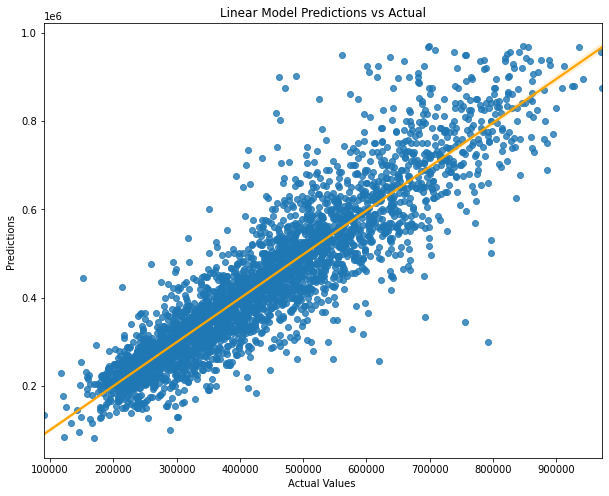

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.8190987699521978
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gam

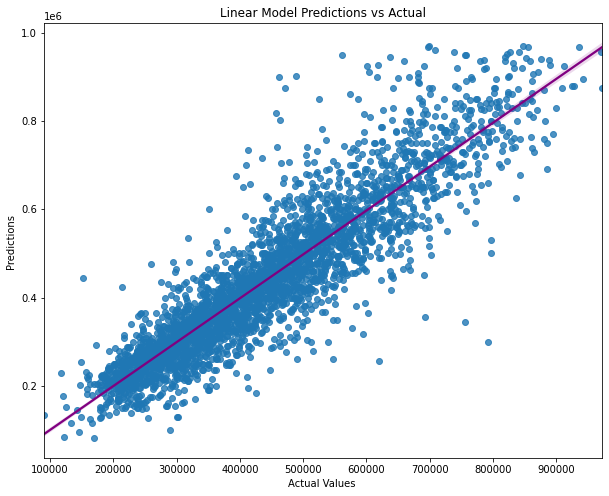

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [43]:
funky_function4_1_2(data_to_test, model_list)

In [73]:
def funky_function4_1_4(data, model_list):
    X = pd.get_dummies(data.drop('price', axis=1))
    y = data['price']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
    scaler = StandardScaler()
    scaler.fit(X_train)
    X_train, X_test = (scaler.transform(X_train), scaler.transform(X_test))
    results = {}
    results_mae = {}
    results_mse = {}
    for model in model_list:
        model.fit(X_train, y_train)
        results[model] = model.score(X_test, y_test)
        print(model, 'R2 score:', model.score(X_test, y_test))
        y_pred = model.predict(X_test)
        results2 = mean_absolute_error(y_test, y_pred)
        results3 = mean_squared_error(y_test, y_pred, squared=False)
        print('Mean Absolute Error:', results2)
        print('Mean Squared Error:', results3)
        results_mae[model] = results2
        results_mse[model] = results3
        plt.figure(figsize=(10,8))
        sns.regplot(x=y_pred, y=y_test, line_kws={"color": "orange"})
        plt.xlabel('Actual Values ')
        plt.ylabel('Predictions ')
        plt.title('Linear Model Predictions vs Actual')
        plt.show()
    final_result_r2 = max(results.values())
    final_result_mae = min(results_mae.values())
    final_result_mse = min(results_mse.values())
    print("--------------------------------------------------------------------------------------------------------")
    print('TAA DAAA!! AND THE WINNER IIIISSSSS:')
    print("--------------------------------------------------------------------------------------------------------")
    best_mae_model = min(results_mae, key=results_mae.get)
    best_r2_model = max(results, key=results.get)
    best_mse_model = min(results_mse, key=results_mse.get)
    print('Best R2:', best_r2_model, final_result_r2)
    print('Best Mean Absolute Error:', best_mae_model, final_result_mae)
    print('Best Mean Squared Error:', best_mse_model, final_result_mse)
    plt.figure(figsize=(10,8))
    sns.regplot(x=best_r2_model.predict(X_test), y=y_test, line_kws={"color": "orange"})
    plt.xlabel('Actual Values ')
    plt.ylabel('Predictions ')
    plt.title('Linear Model R2 Predictions vs Actual')
    plt.show()
    plt.figure(figsize=(10,8))
    sns.regplot(x=best_mae_model.predict(X_test), y=y_test, line_kws={"color": "green"})
    plt.xlabel('Actual Values ')
    plt.ylabel('Predictions ')
    plt.title('Linear Model MAE Predictions vs Actual')
    plt.show()
    plt.figure(figsize=(10,8))
    sns.regplot(x=best_mse_model.predict(X_test), y=y_test, line_kws={"color": "yellow"})
    plt.xlabel('Actual Values ')
    plt.ylabel('Predictions ')
    plt.title('Linear Model MSE Predictions vs Actual')
    plt.show()
    return best_mae_model, best_mse_model, best_r2_model

In [45]:
data_to_test = data3wo.drop(['id', 'lon', 'id', 'data', 'yr_built', 'sqft_lot', 'sqft_lot'], axis = 1)

In [48]:
data_to_test2 = data3wo[['sqft_living','grade', 'lat', 'waterfront', 'floors', 'sqft_above', 'yr_renovated','sqft_living15', 'bathrooms', 'view', 'sqft_basement', 'bedrooms', 'price']]


In [54]:
data_to_test2_1 = data3wo[['sqft_living','grade', 'lat', 'data', 'waterfront', 'floors', 'sqft_above', 'yr_renovated','sqft_living15', 'bathrooms', 'view', 'sqft_basement', 'bedrooms', 'price']]


In [55]:
data_to_test2_2 = data3wo[['sqft_living','grade', 'lat', 'data', 'zip_code', 'waterfront', 'floors', 'sqft_above', 'yr_renovated','sqft_living15', 'bathrooms', 'view', 'sqft_basement', 'bedrooms', 'price']]


In [56]:
data_to_test3 = data3wo[['id', 'data', 'sqft_lot', 'waterfront', 'sqft_above',
       'sqft_basement', 'yr_built', 'lat', 'lon', 'sqft_living15',
       'sqft_lot15', 'yr_renovated', 'basement', 'price']]

In [57]:
data_to_test3_1 = data3wo[['id', 'data', 'sqft_lot', 'waterfront', 'sqft_above',
       'sqft_basement', 'yr_built', 'lat', 'lon', 'sqft_living15',
       'sqft_lot15', 'yr_renovated', 'basement', 'zip_code', 'price']]

In [58]:
data_to_test3_2 = data3wo[['data', 'sqft_lot', 'waterfront', 'sqft_above',
       'sqft_basement', 'yr_built', 'sqft_living15',
       'sqft_lot15', 'yr_renovated', 'basement', 'zip_code', 'price']]

In [76]:
data3wo.columns

Index(['id', 'data', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zip_code', 'lat', 'lon',
       'sqft_living15', 'sqft_lot15', 'price', 'basement'],
      dtype='object')

LinearRegression() R2 score: 0.8177538610471758
Mean Absolute Error: 55007.83379976135
Mean Squared Error: 75208.0188021167


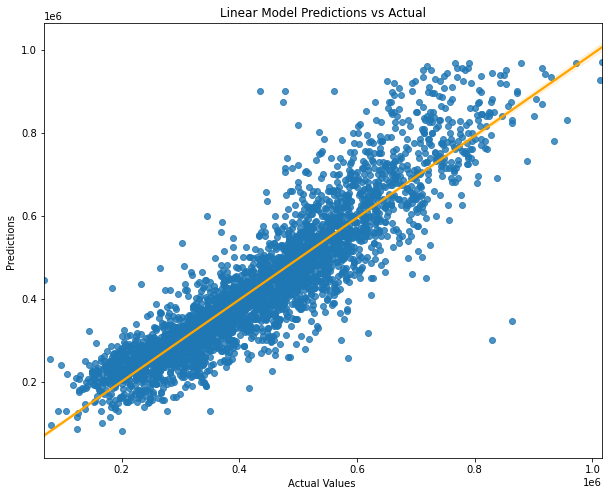

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.7358582983296267
Mean Absolute Error: 63414.09885620916
Mean Squared Error: 90542.70515918684


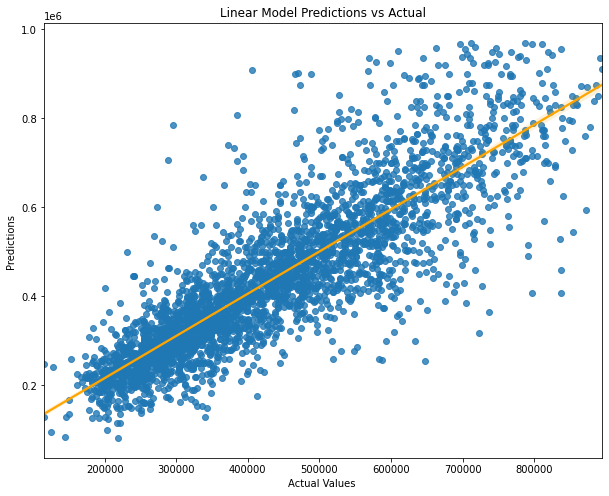

KNeighborsRegressor(n_jobs=10) R2 score: 0.7495179960700175
Mean Absolute Error: 61690.44191176472
Mean Squared Error: 88170.48804358239


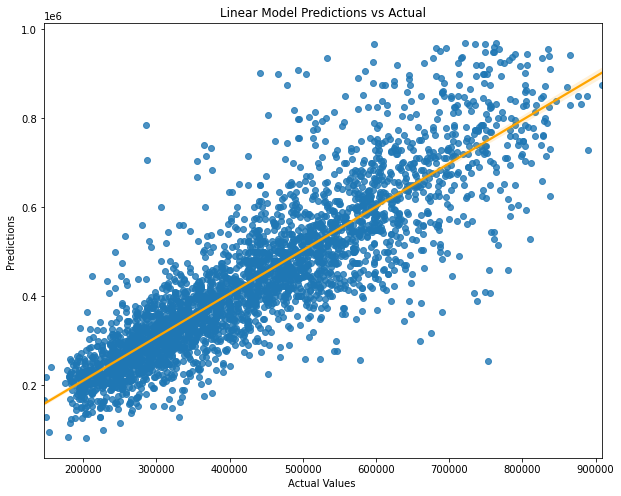

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.7549998256177191
Mean Absolute Error: 61045.91202731093
Mean Squared Error: 87200.33972376275


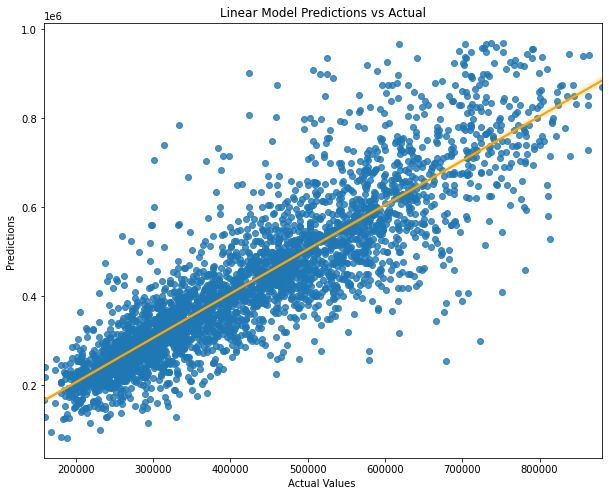

MLPRegressor(random_state=42) R2 score: -3.9058501619920865
Mean Absolute Error: 364855.402435269
Mean Squared Error: 390204.36197693204


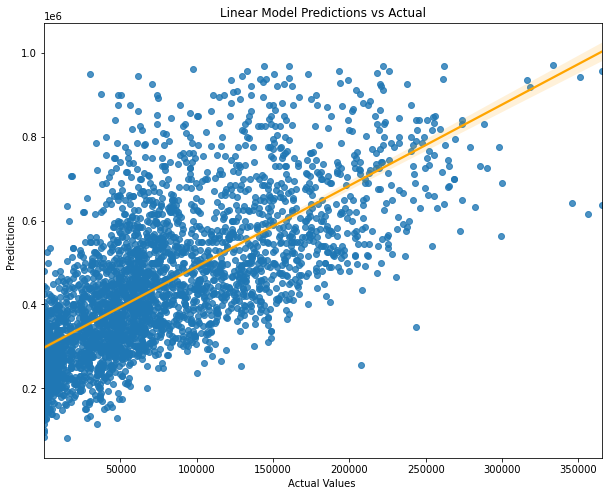

RandomForestRegressor() R2 score: 0.8381244468850975
Mean Absolute Error: 48892.519807598044
Mean Squared Error: 70880.31074269723


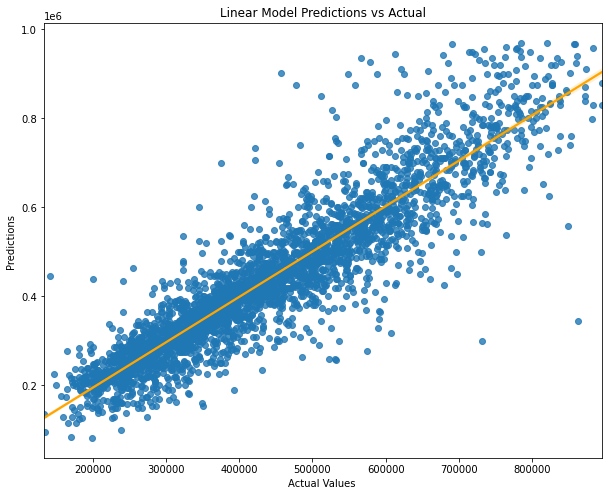

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.8437953495116762
Mean Absolute Error: 48365.52562279795
Mean Squared Error: 69627.6856431433


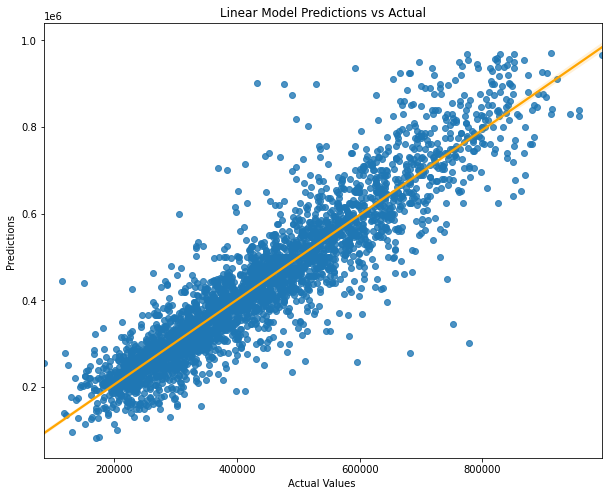

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.8518131495556545
Mean Absolute Error: 46984.897073184744
Mean Squared Error: 67817.19361288495


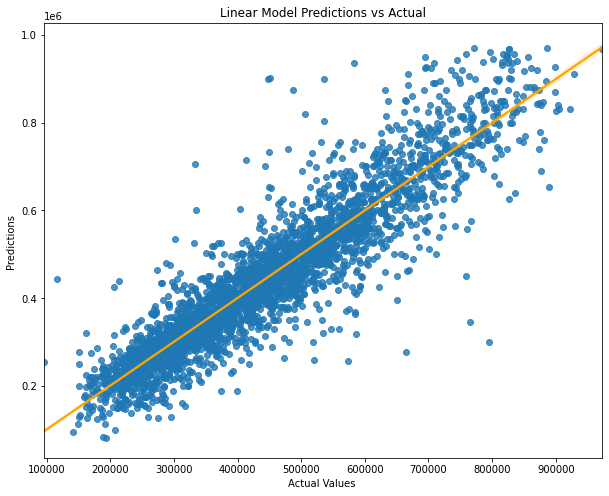

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.8518131495556545
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gam

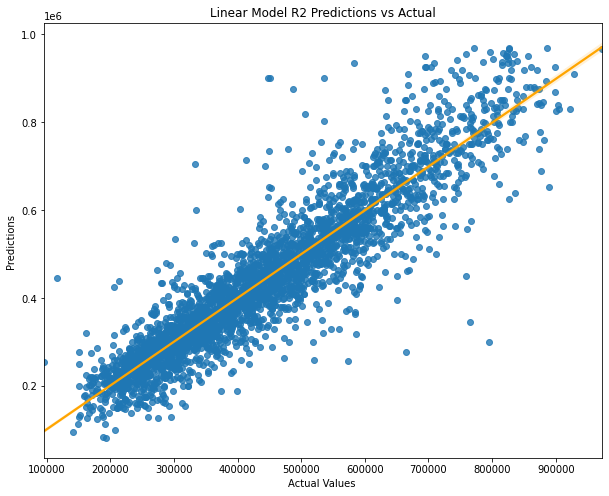

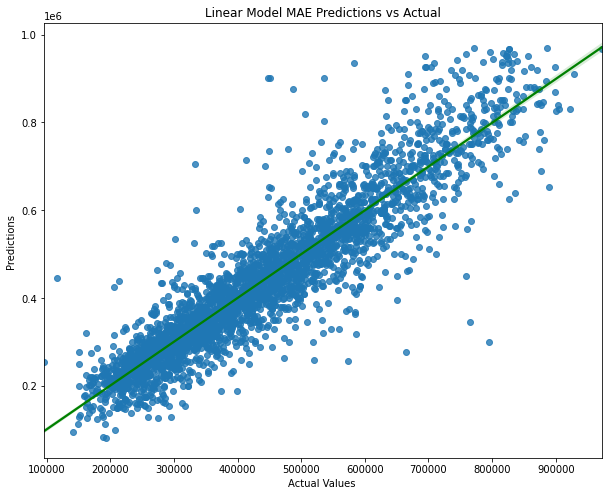

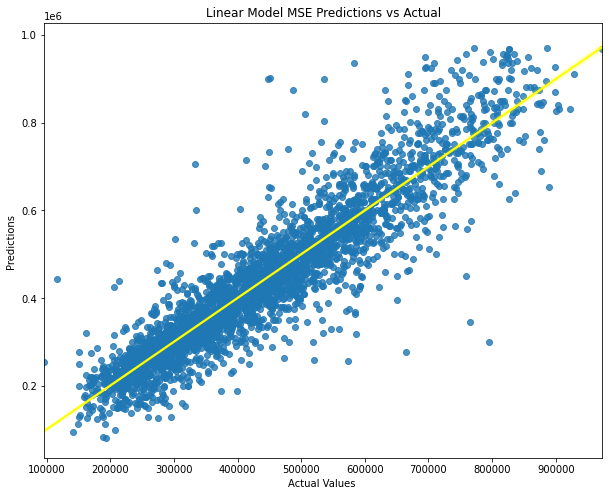

(XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None),
 XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=

In [72]:
funky_function4_1_4(data3wo, model_list)

### The best result out of any tests so far in both files
Best R2: XGBRegressor() 0.8518131495556545
Best Mean Absolute Error: XGBRegressor() 46984.897073184744
Best Mean Squared Error: XGBRegressor() 67817.19361288495

LinearRegression() R2 score: 0.8137577487627279
Mean Absolute Error: 55617.64851173433
Mean Squared Error: 76028.09110657584


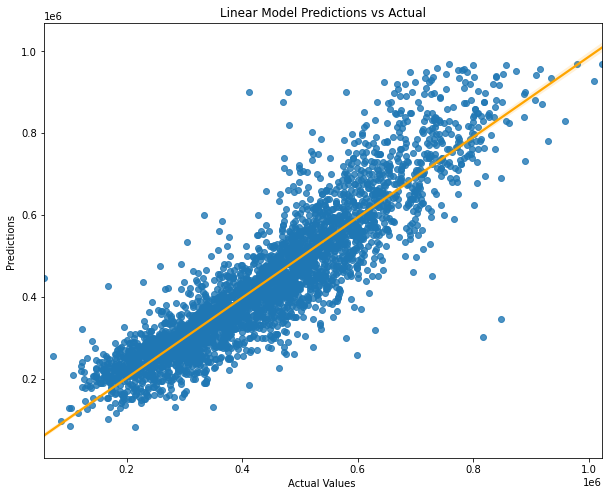

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.7248320328574251
Mean Absolute Error: 64817.37816584967
Mean Squared Error: 92413.18063852796


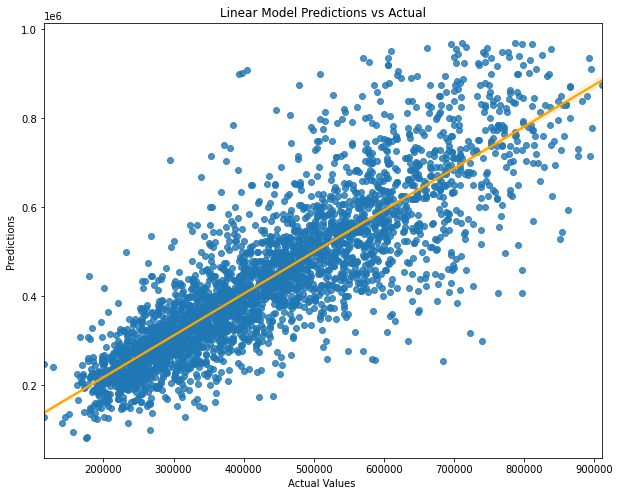

KNeighborsRegressor(n_jobs=10) R2 score: 0.7435669168196125
Mean Absolute Error: 62135.99736519608
Mean Squared Error: 89211.73942334308


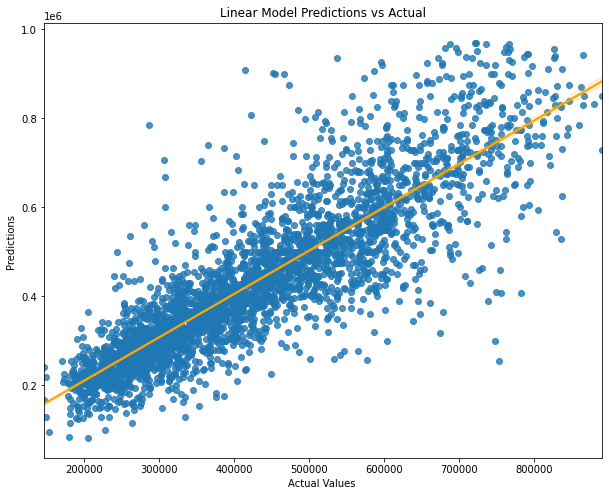

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.7514563788086105
Mean Absolute Error: 61461.372855392154
Mean Squared Error: 87828.66690891572


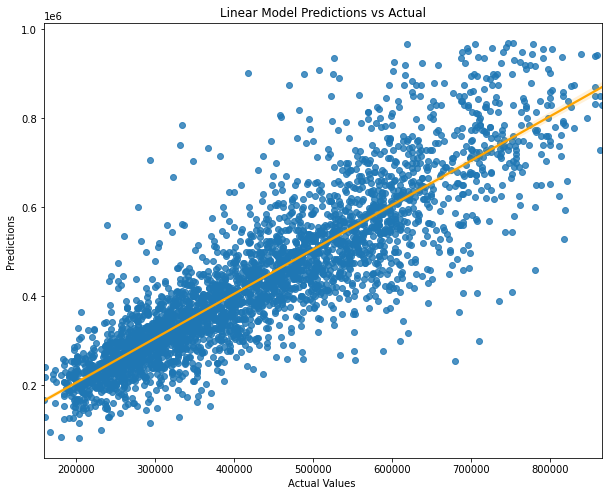

MLPRegressor(random_state=42) R2 score: -3.8712850505542784
Mean Absolute Error: 364972.04910647986
Mean Squared Error: 388827.30214111484


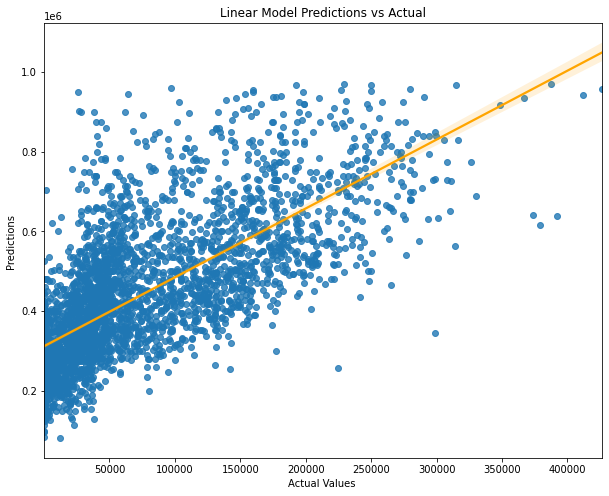

RandomForestRegressor() R2 score: 0.8209119686431527
Mean Absolute Error: 51583.0082022481
Mean Squared Error: 74553.53856813582


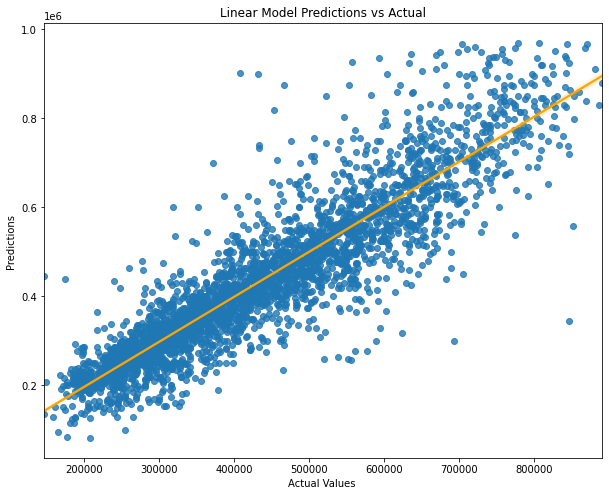

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.8180857636031988
Mean Absolute Error: 52375.83264878217
Mean Squared Error: 75139.50402009045


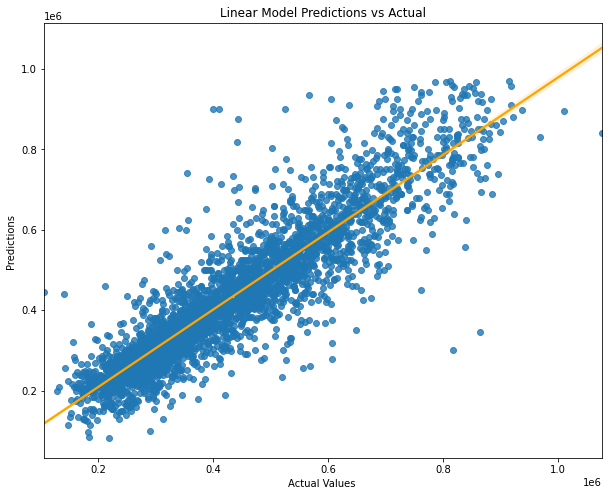

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.8331213538593026
Mean Absolute Error: 50470.36769732307
Mean Squared Error: 71967.32559929021


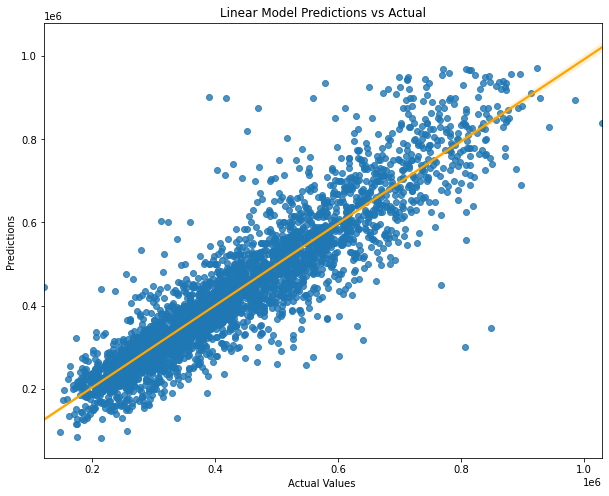

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.8331213538593026
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gam

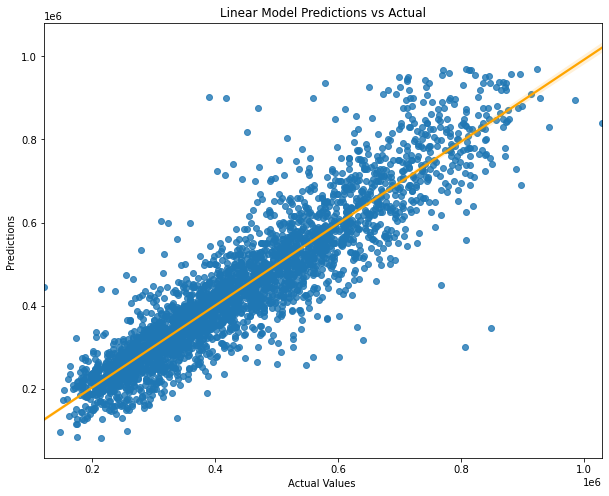

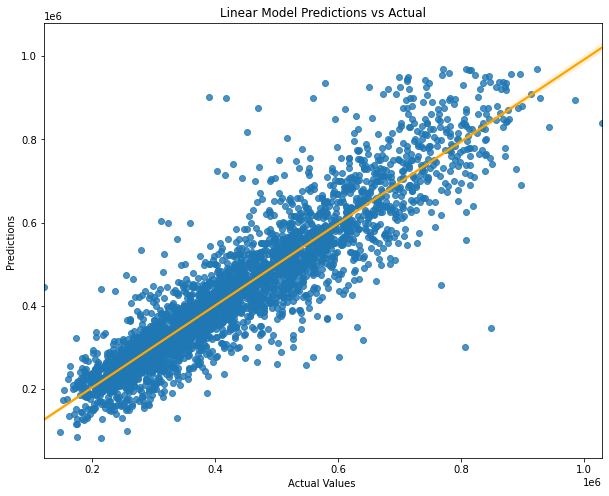

(XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None),
 XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=

In [47]:
funky_function4_1_4(data_to_test, model_list)

LinearRegression() R2 score: 0.5846992801549242
Mean Absolute Error: 86045.96987322773
Mean Squared Error: 113531.48594321235


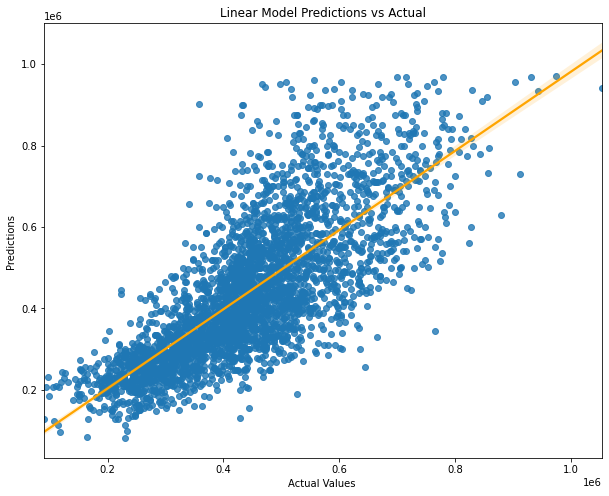

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.5831729631646181
Mean Absolute Error: 80932.62632761437
Mean Squared Error: 113739.92058451506


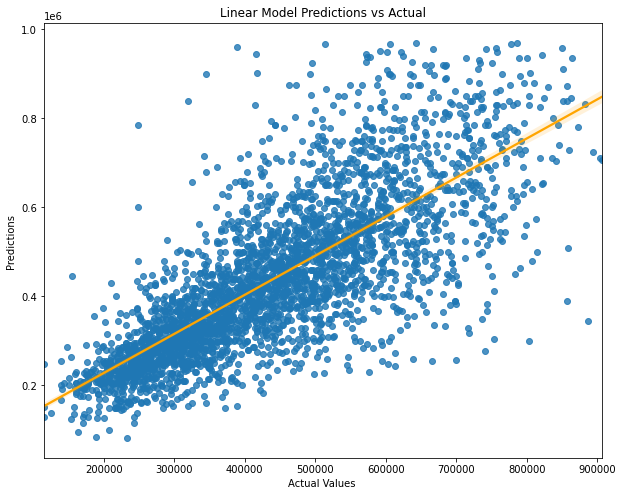

KNeighborsRegressor(n_jobs=10) R2 score: 0.6069257700683048
Mean Absolute Error: 78324.49044117647
Mean Squared Error: 110451.6648182137


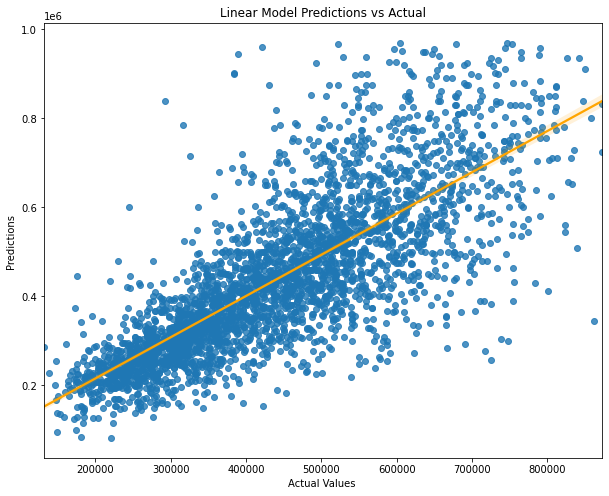

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.6144933561581079
Mean Absolute Error: 78155.34865196078
Mean Squared Error: 109383.27284637776


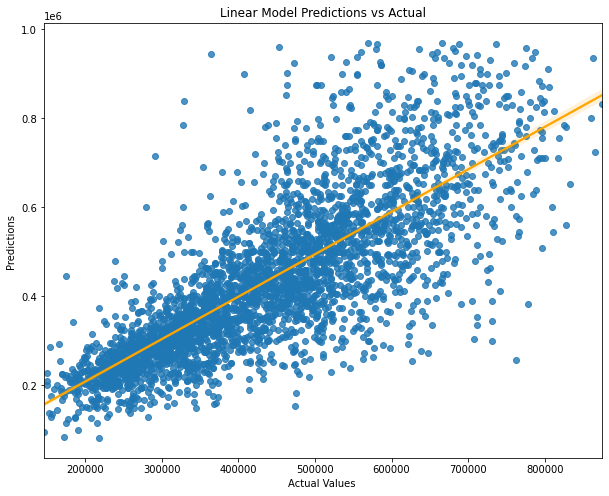

MLPRegressor(random_state=42) R2 score: -4.418812343602422
Mean Absolute Error: 378029.36677474953
Mean Squared Error: 410097.41887254425


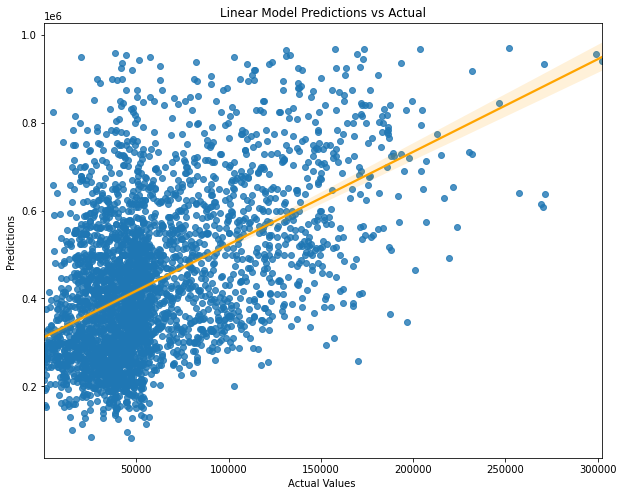

RandomForestRegressor() R2 score: 0.7760366508777714
Mean Absolute Error: 58451.30790358748
Mean Squared Error: 83372.62140110086


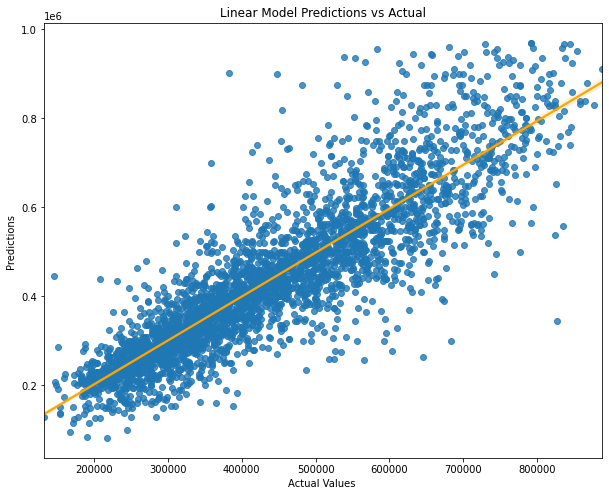

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.7568309101100572
Mean Absolute Error: 62156.482316559435
Mean Squared Error: 86873.86924617026


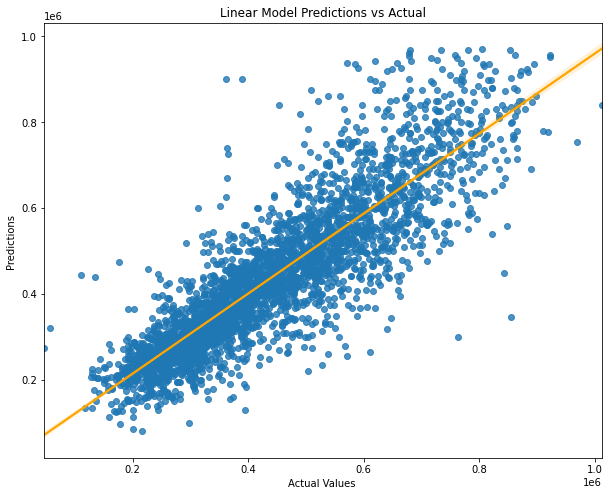

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.7785184998656078
Mean Absolute Error: 58904.88983273974
Mean Squared Error: 82909.38780469241


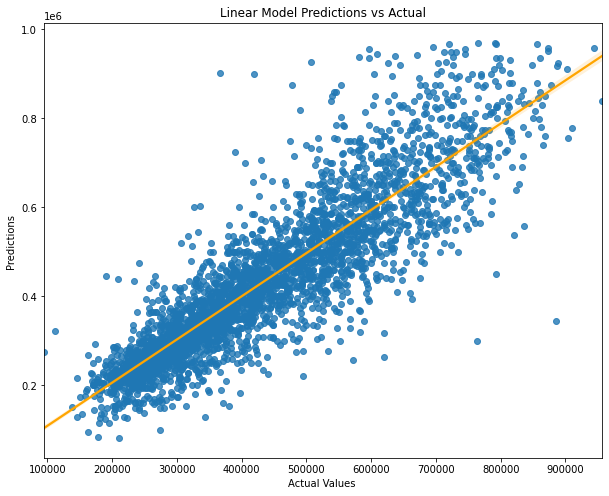

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.7785184998656078
Best Mean Absolute Error: RandomForestRegressor() 58451.30790358748
Best Mean Squared Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_

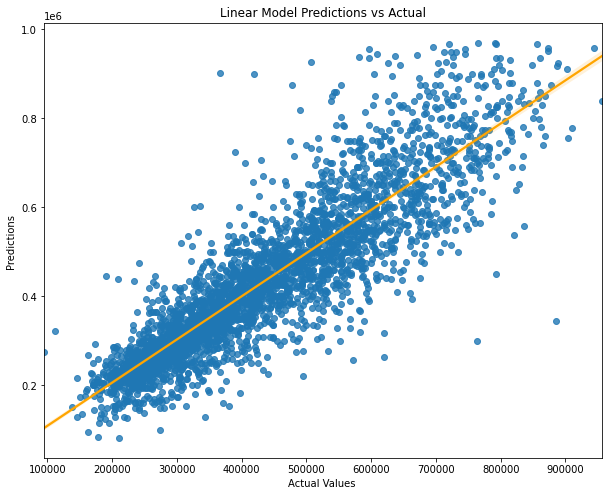

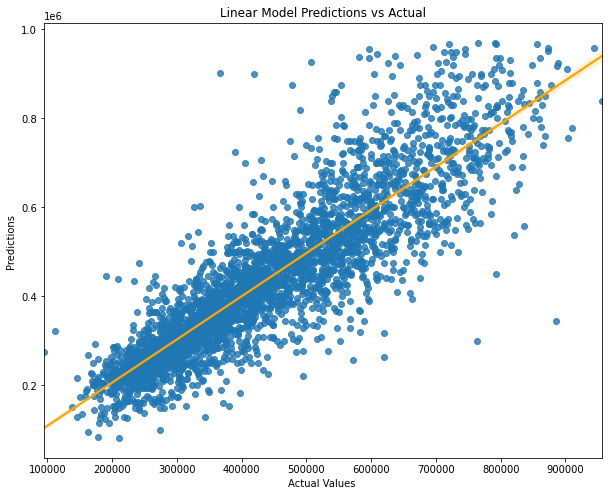

(RandomForestRegressor(),
 XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None),
 XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_j

In [52]:
funky_function4_1_4(data_to_test2, model_list)

LinearRegression() R2 score: 0.5735557497004145
Mean Absolute Error: 87873.37350152514
Mean Squared Error: 115044.56645140049


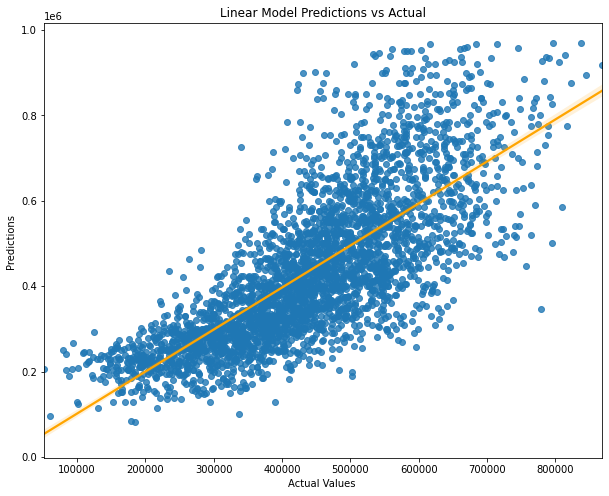

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.6717857338731081
Mean Absolute Error: 71104.35059232028
Mean Squared Error: 100928.47406749547


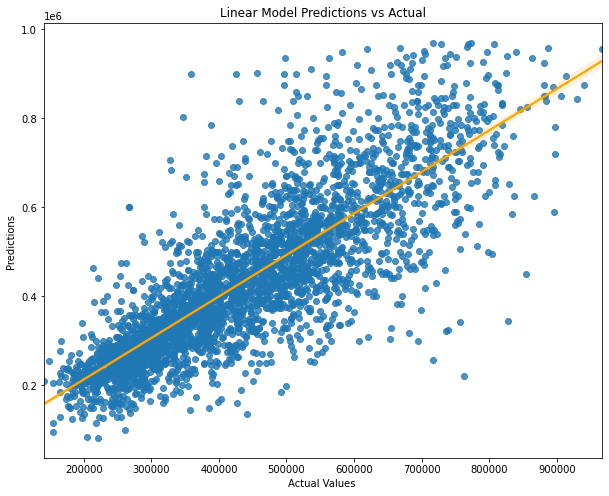

KNeighborsRegressor(n_jobs=10) R2 score: 0.7013475801832767
Mean Absolute Error: 68260.82346813726
Mean Squared Error: 96275.99132932354


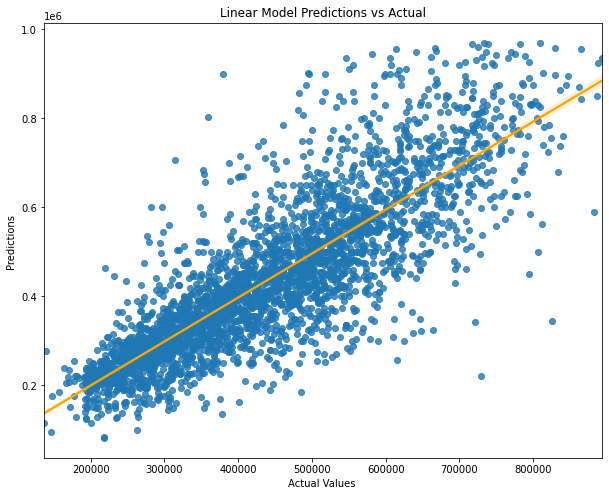

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.7093544783622224
Mean Absolute Error: 67642.5218837535
Mean Squared Error: 94976.6392410248


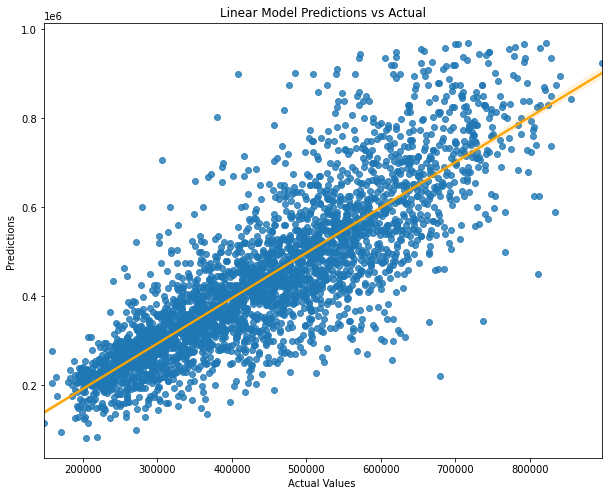

MLPRegressor(random_state=42) R2 score: -5.305330694199136
Mean Absolute Error: 409187.61180532345
Mean Squared Error: 442373.30803911644


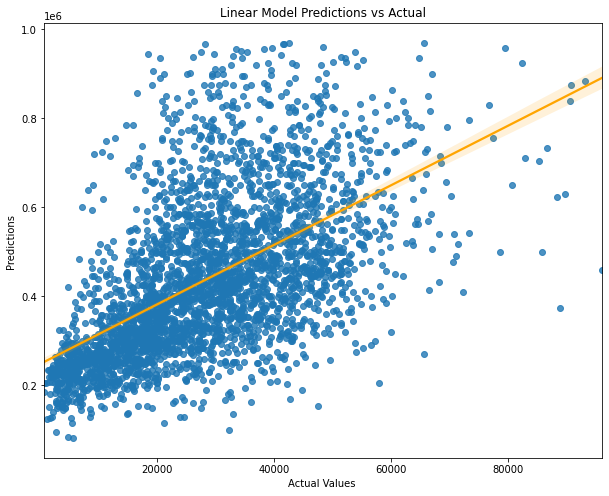

RandomForestRegressor() R2 score: 0.8254224880187534
Mean Absolute Error: 51063.70625801675
Mean Squared Error: 73608.6970021352


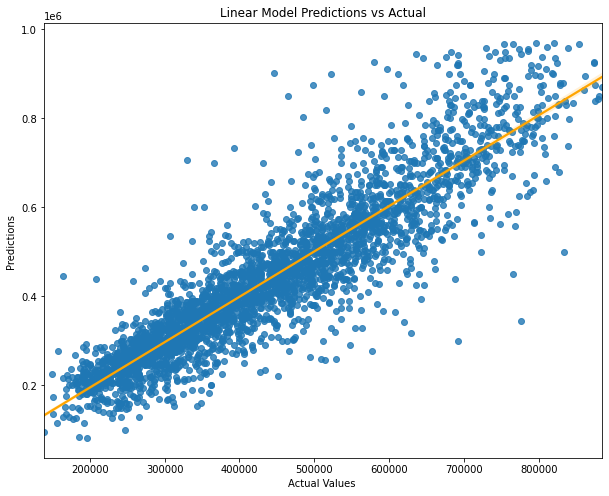

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.82225007283327
Mean Absolute Error: 52108.37290445963
Mean Squared Error: 74274.4929846107


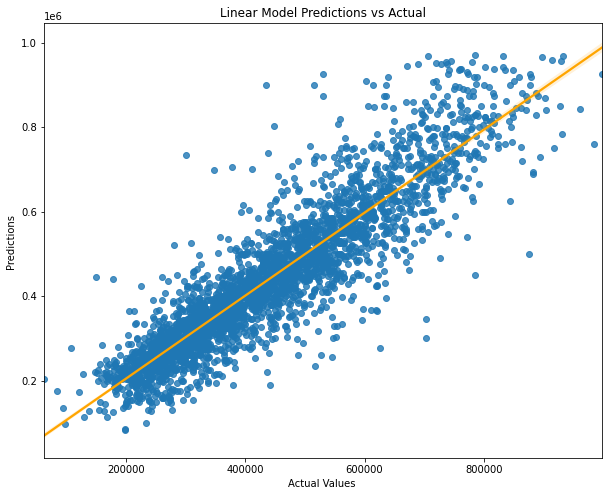

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.8303955829534332
Mean Absolute Error: 50615.782116459864
Mean Squared Error: 72552.69671911308


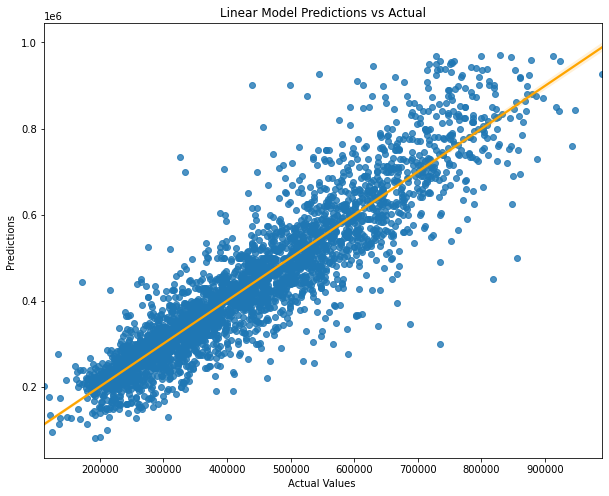

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.8303955829534332
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gam

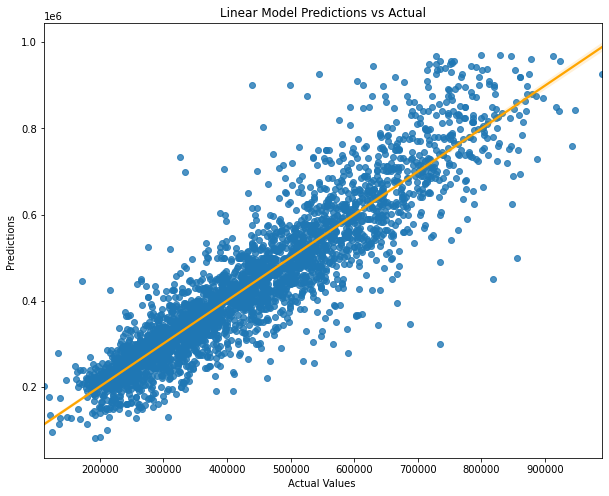

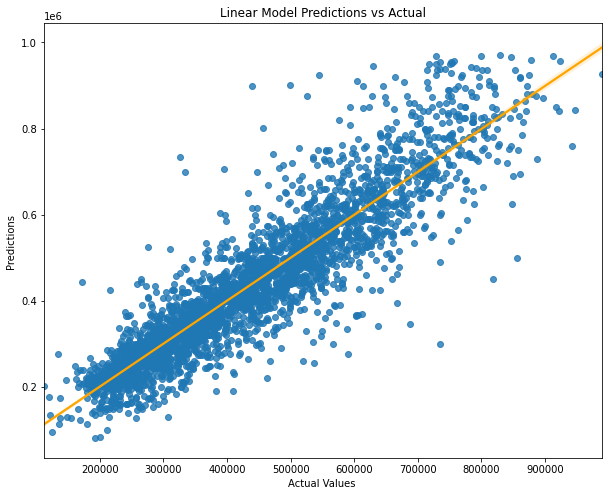

(XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None),
 XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=

In [53]:
funky_function4_1_4(data_to_test3, model_list)

LinearRegression() R2 score: 0.5865462237791563
Mean Absolute Error: 85735.65235178173
Mean Squared Error: 113278.75353100392


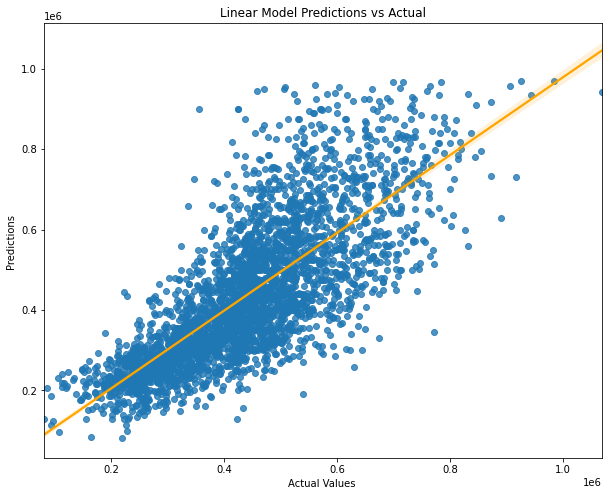

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.5595467060841031
Mean Absolute Error: 83582.48815359476
Mean Squared Error: 116918.95128497444


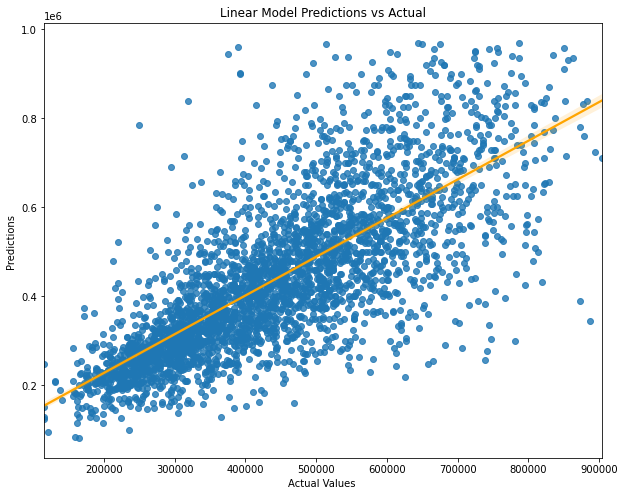

KNeighborsRegressor(n_jobs=10) R2 score: 0.5760389699146483
Mean Absolute Error: 82650.93143382354
Mean Squared Error: 114709.12038304785


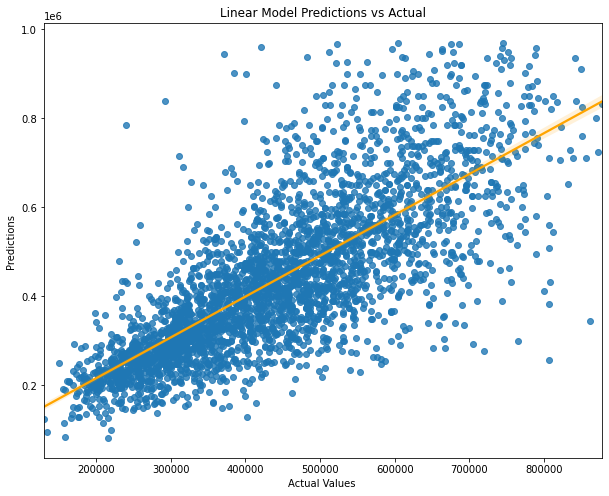

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.5822316089733621
Mean Absolute Error: 82639.11580882352
Mean Squared Error: 113868.28218142198


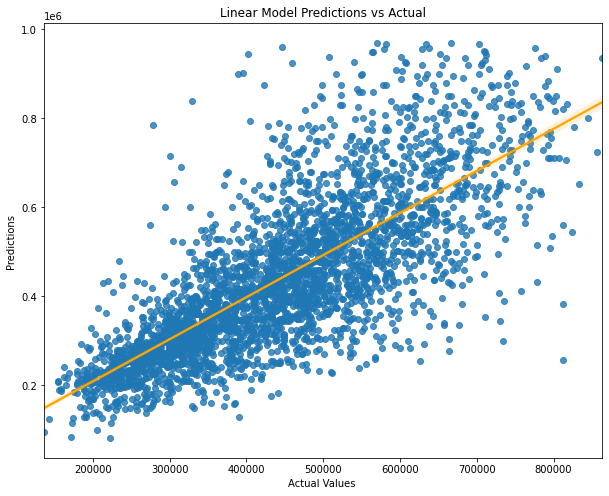

MLPRegressor(random_state=42) R2 score: -4.591111694617633
Mean Absolute Error: 382986.7913047167
Mean Squared Error: 416566.23428929393


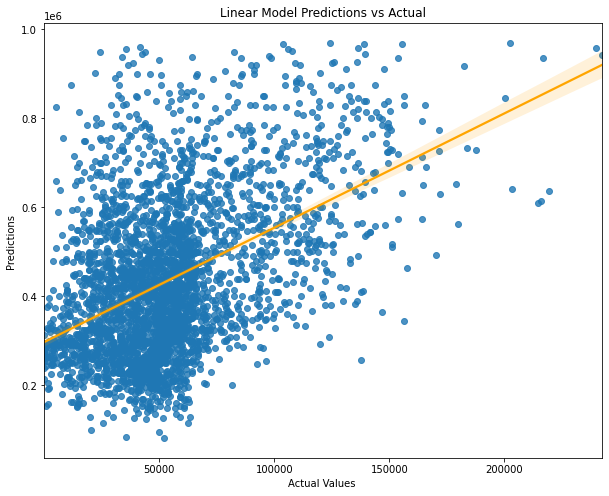

RandomForestRegressor() R2 score: 0.7827870395207002
Mean Absolute Error: 57750.455432094706
Mean Squared Error: 82106.55822162896


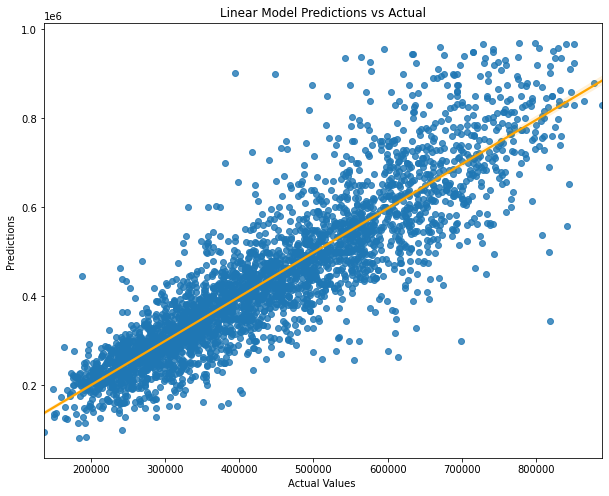

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.764538392806565
Mean Absolute Error: 61094.015196557135
Mean Squared Error: 85486.00705392897


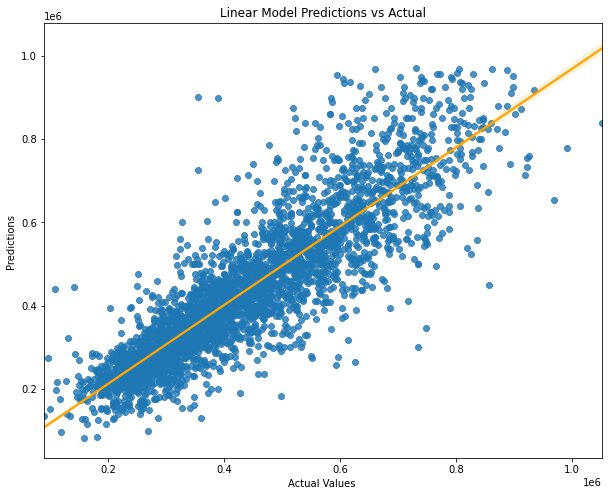

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.7821757214892764
Mean Absolute Error: 58255.09879317938
Mean Squared Error: 82222.01623445025


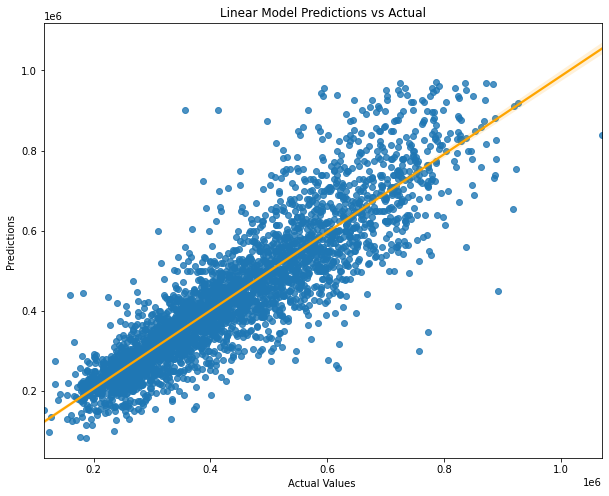

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: RandomForestRegressor() 0.7827870395207002
Best Mean Absolute Error: RandomForestRegressor() 57750.455432094706
Best Mean Squared Error: RandomForestRegressor() 82106.55822162896


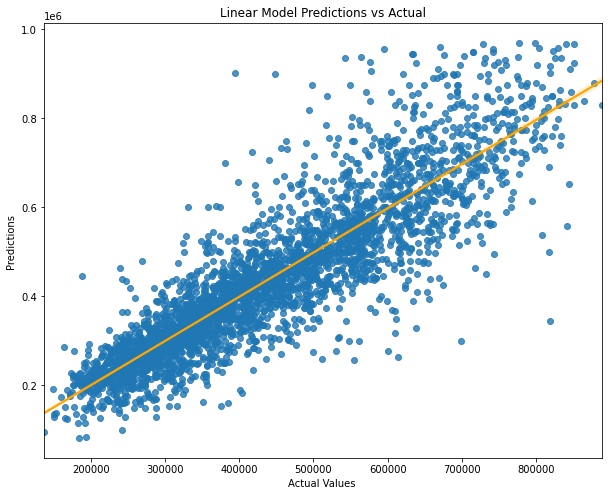

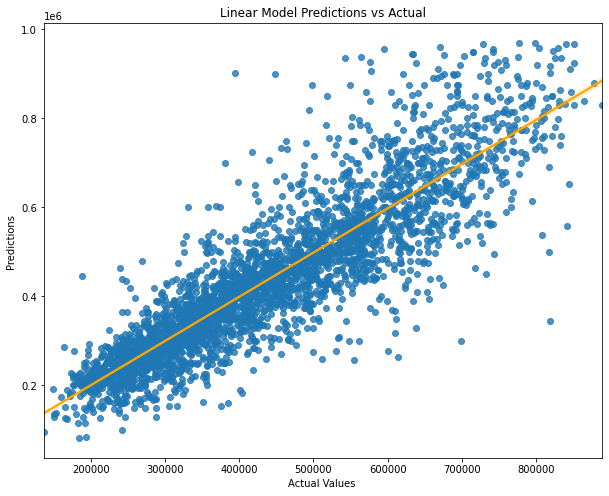

(RandomForestRegressor(), RandomForestRegressor(), RandomForestRegressor())

In [59]:
funky_function4_1_4(data_to_test2_1, model_list)

LinearRegression() R2 score: 0.8101008366526093
Mean Absolute Error: 56721.86375082663
Mean Squared Error: 76770.8777053165


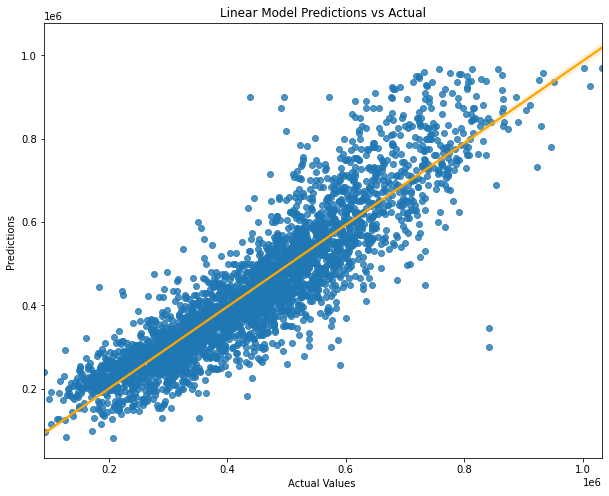

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.7301692492412302
Mean Absolute Error: 64745.690972222226
Mean Squared Error: 91512.55924495916


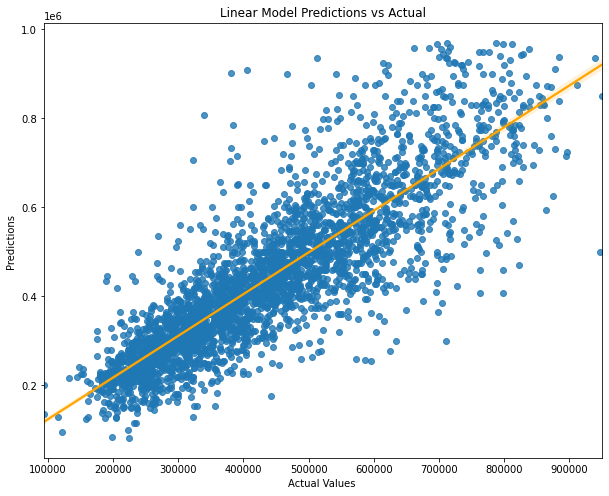

KNeighborsRegressor(n_jobs=10) R2 score: 0.7412967972301683
Mean Absolute Error: 63009.85330882353
Mean Squared Error: 89605.75074549293


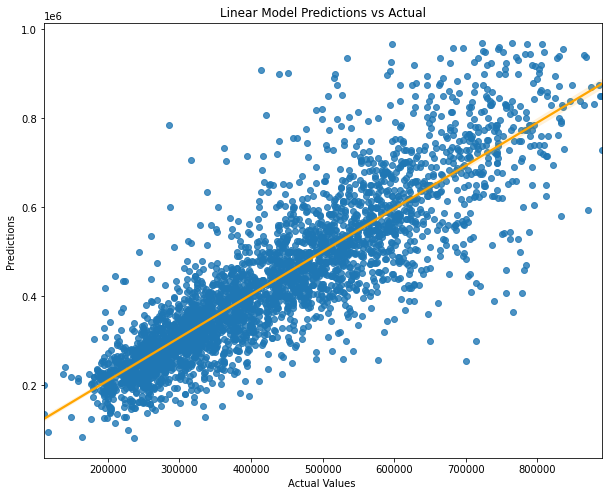

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.7455868541175601
Mean Absolute Error: 62619.48638830531
Mean Squared Error: 88859.68190473093


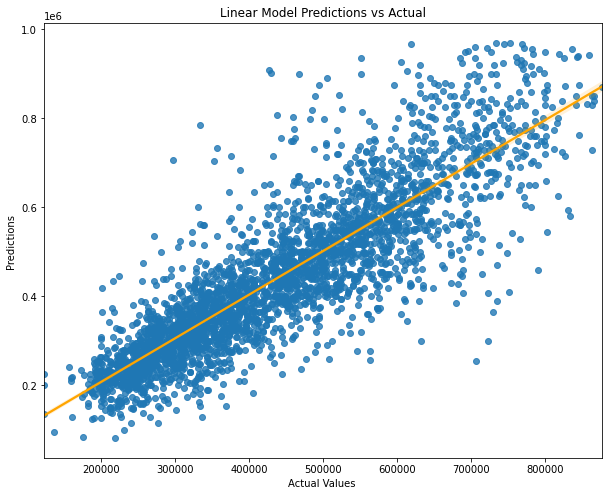

MLPRegressor(random_state=42) R2 score: -4.196020933457447
Mean Absolute Error: 376631.008598541
Mean Squared Error: 401578.4750430699


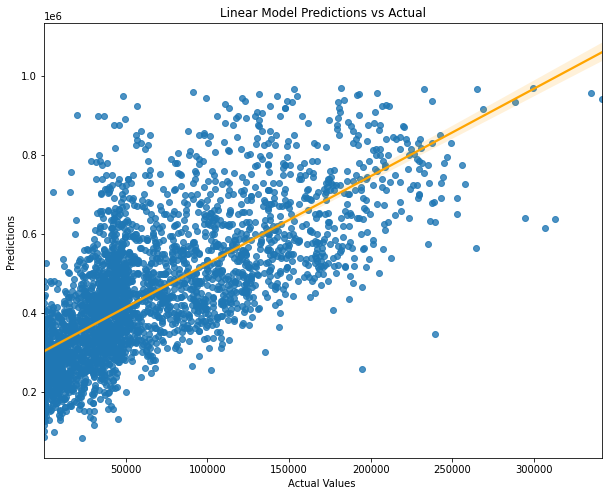

RandomForestRegressor() R2 score: 0.8169239469475318
Mean Absolute Error: 52632.01372899161
Mean Squared Error: 75379.06576926827


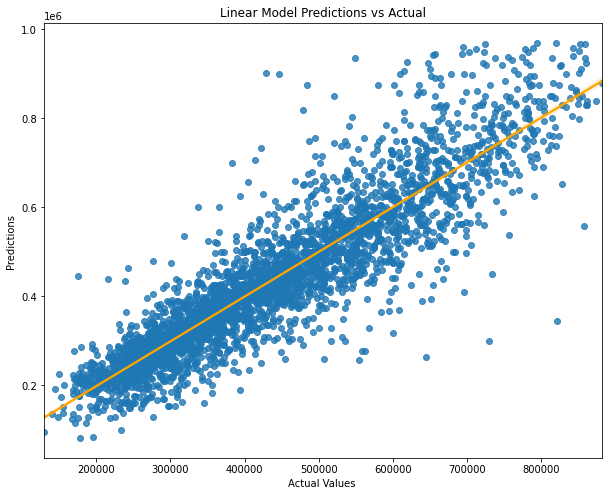

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.8158046860066128
Mean Absolute Error: 53682.56704293045
Mean Squared Error: 75609.13487219781


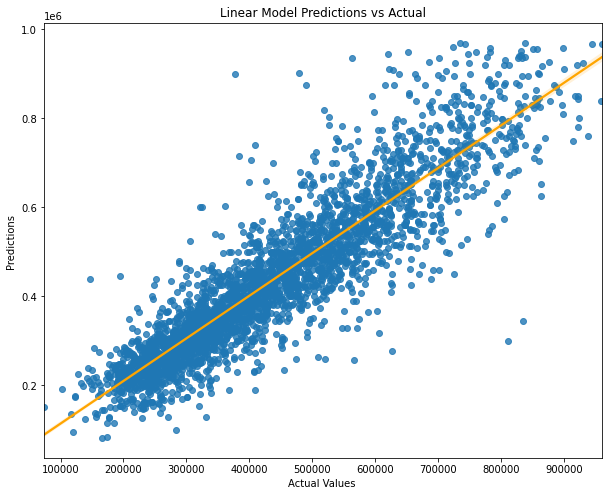

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.8308423928018884
Mean Absolute Error: 51138.29859116498
Mean Squared Error: 72457.06643318968


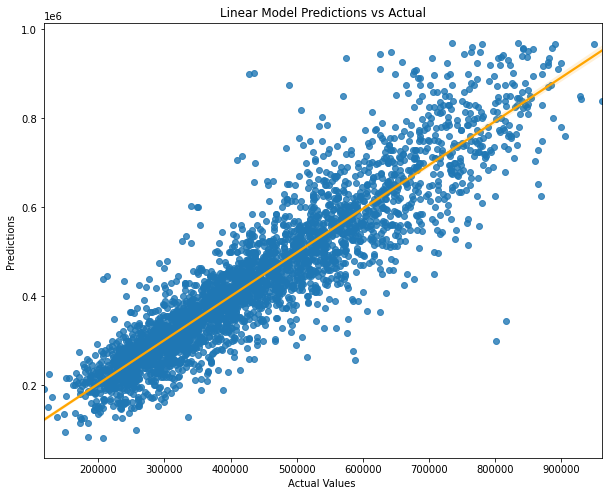

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.8308423928018884
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gam

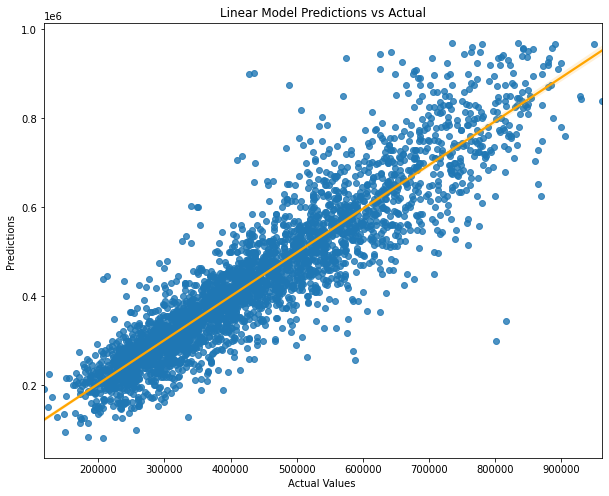

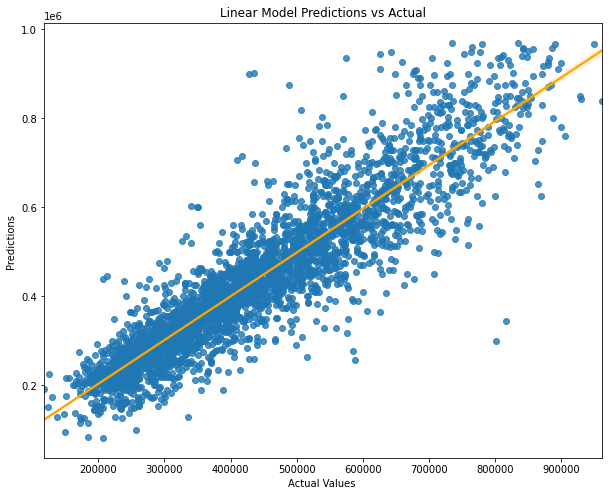

(XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None),
 XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=

In [60]:
funky_function4_1_4(data_to_test2_2, model_list)

LinearRegression() R2 score: 0.7912425593127752
Mean Absolute Error: 59362.03498016071
Mean Squared Error: 80492.6011661392


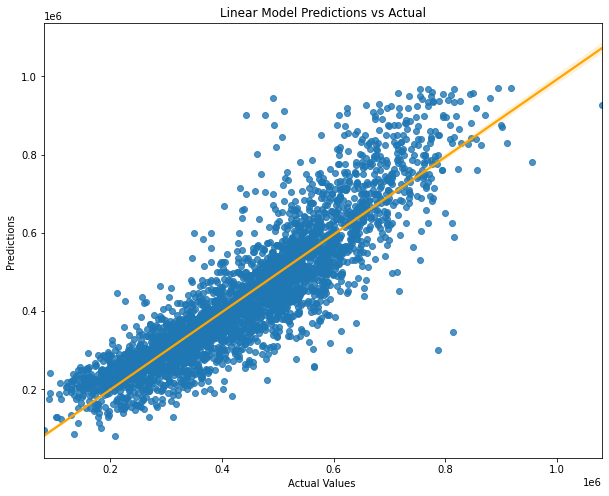

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.7554098630522489
Mean Absolute Error: 61129.18545751633
Mean Squared Error: 87127.33900761808


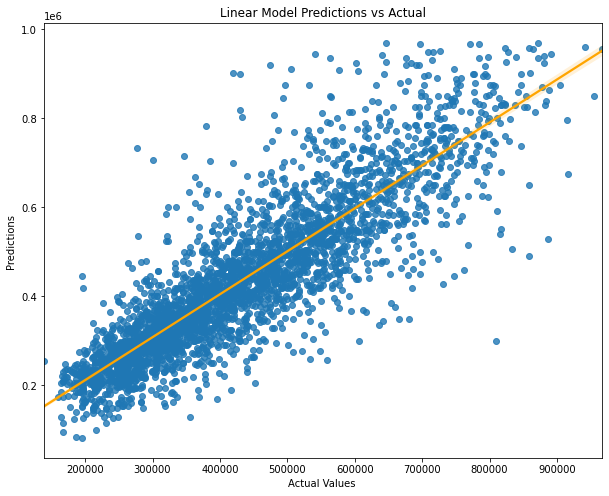

KNeighborsRegressor(n_jobs=10) R2 score: 0.7665648930952043
Mean Absolute Error: 59945.61531862745
Mean Squared Error: 85117.34446244723


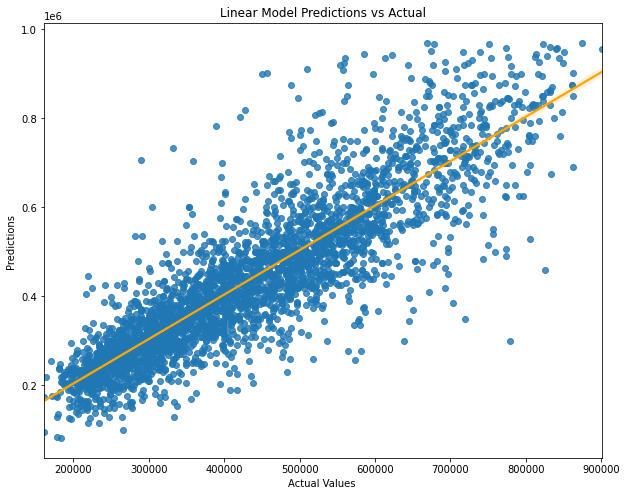

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.7688556412334124
Mean Absolute Error: 59710.08889180672
Mean Squared Error: 84698.67755022911


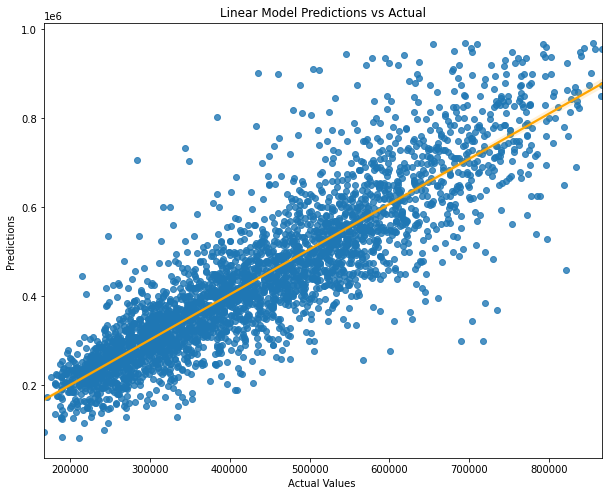

MLPRegressor(random_state=42) R2 score: -4.4957889635939585
Mean Absolute Error: 383132.4793298079
Mean Squared Error: 412999.9546518842


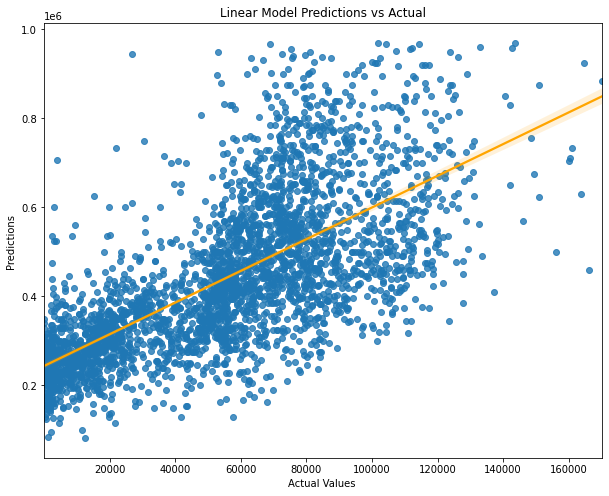

RandomForestRegressor() R2 score: 0.828690961200756
Mean Absolute Error: 50453.633125408494
Mean Squared Error: 72916.38331441228


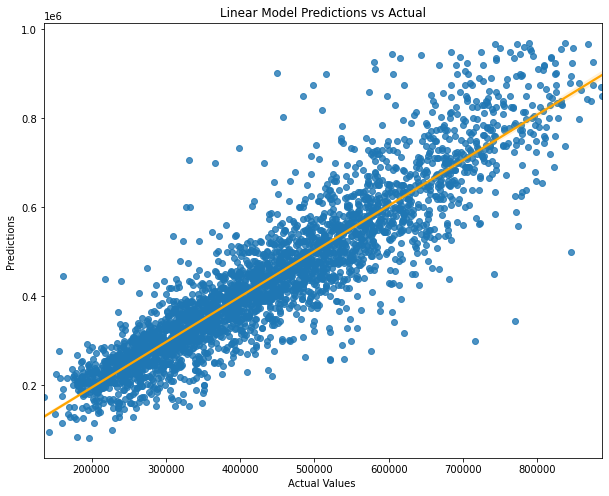

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.8283724604566335
Mean Absolute Error: 50530.12678378236
Mean Squared Error: 72984.13554146957


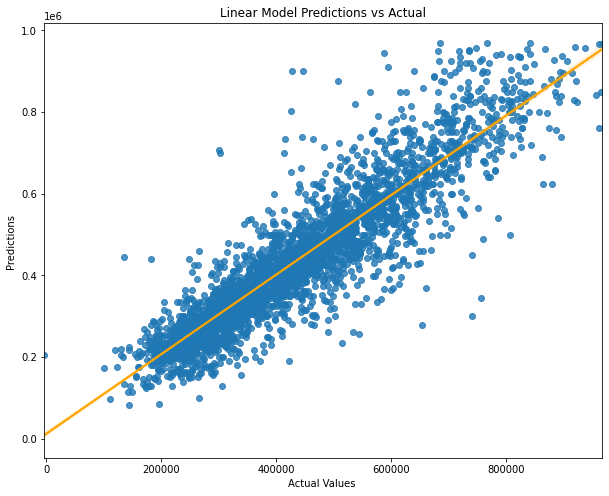

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.8364153145392966
Mean Absolute Error: 49823.13399490656
Mean Squared Error: 71253.51638724623


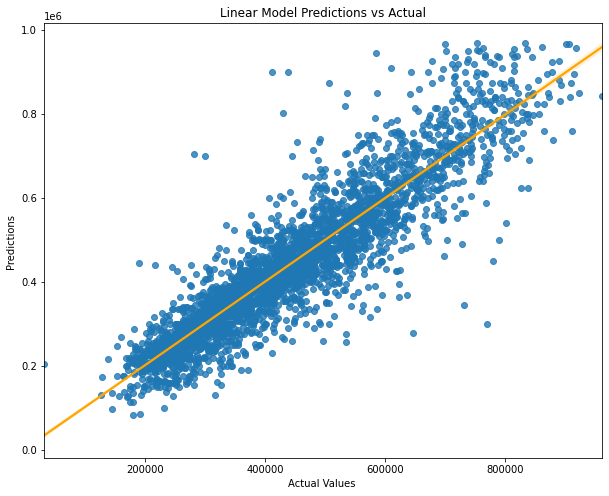

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.8364153145392966
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gam

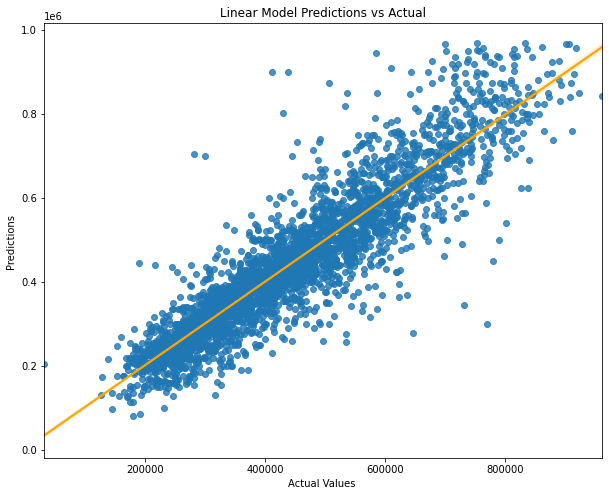

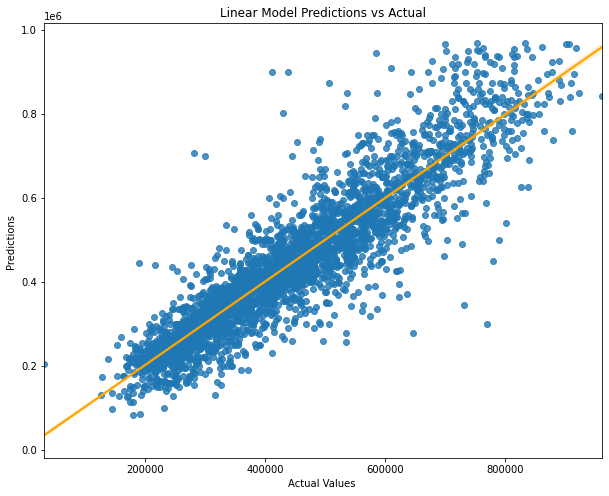

(XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None),
 XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=

In [61]:
funky_function4_1_4(data_to_test3_1, model_list)

LinearRegression() R2 score: 0.7910295109561623
Mean Absolute Error: 59366.24963687172
Mean Squared Error: 80533.66423734532


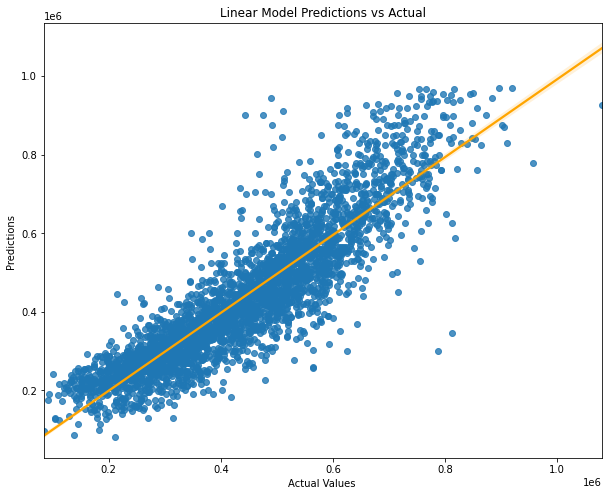

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.7480421733529005
Mean Absolute Error: 61960.63837826798
Mean Squared Error: 88429.85378514032


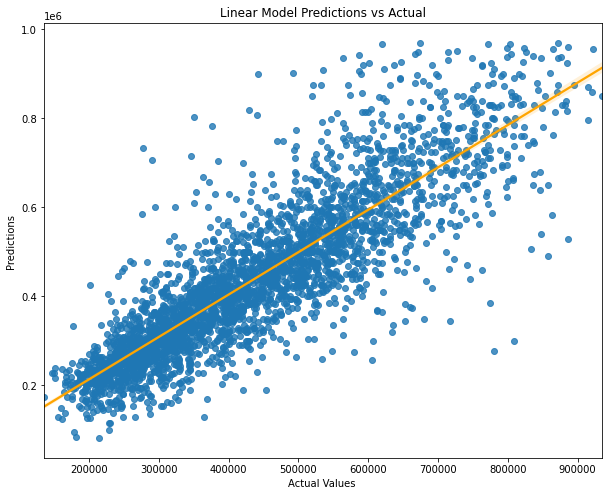

KNeighborsRegressor(n_jobs=10) R2 score: 0.7651779839888041
Mean Absolute Error: 59788.528370098036
Mean Squared Error: 85369.82404420512


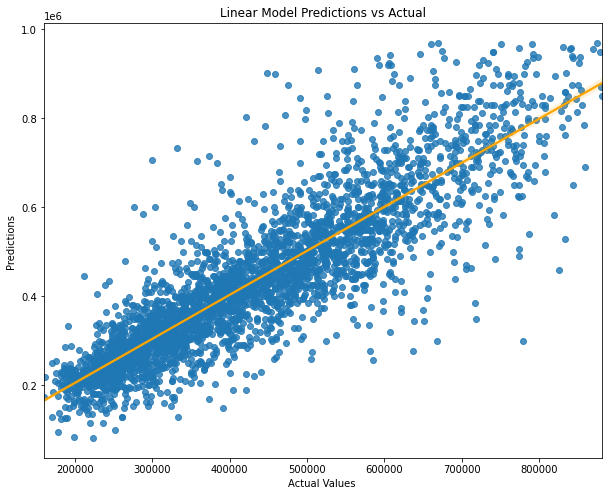

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.7687782462405722
Mean Absolute Error: 59377.90025385154
Mean Squared Error: 84712.8563624202


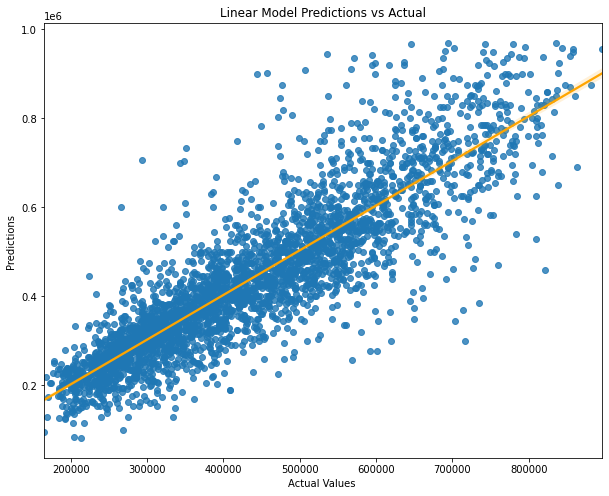

MLPRegressor(random_state=42) R2 score: -4.642016004488201
Mean Absolute Error: 388239.8097485682
Mean Squared Error: 418458.2524603384


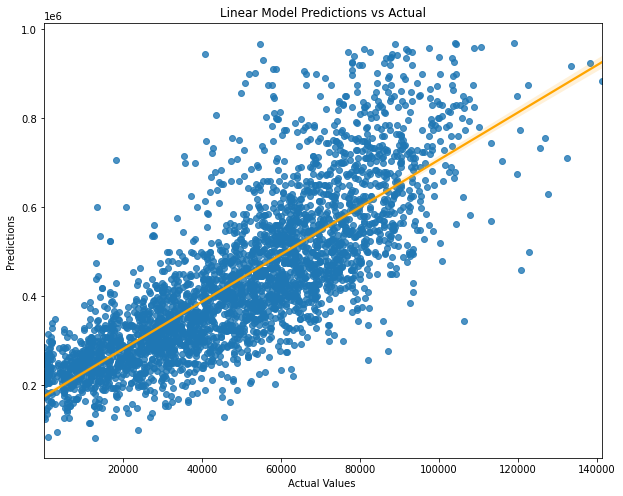

RandomForestRegressor() R2 score: 0.7304983990798242
Mean Absolute Error: 65007.13937515318
Mean Squared Error: 91456.726958576


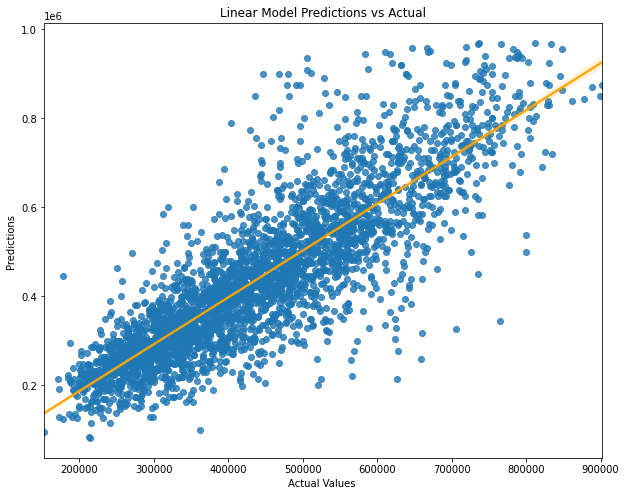

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.7834708946440134
Mean Absolute Error: 58157.78906728707
Mean Squared Error: 81977.20762078244


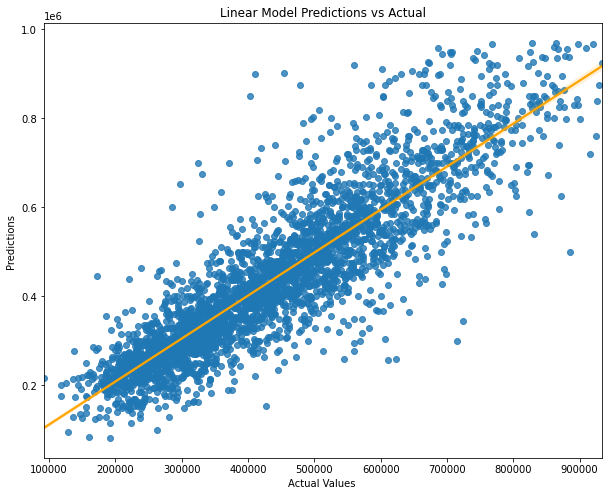

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.7949629688898026
Mean Absolute Error: 56916.287281709556
Mean Squared Error: 79772.1197514335


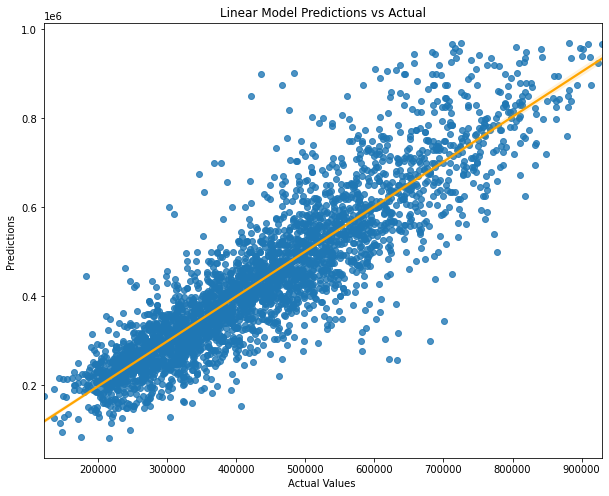

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.7949629688898026
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gam

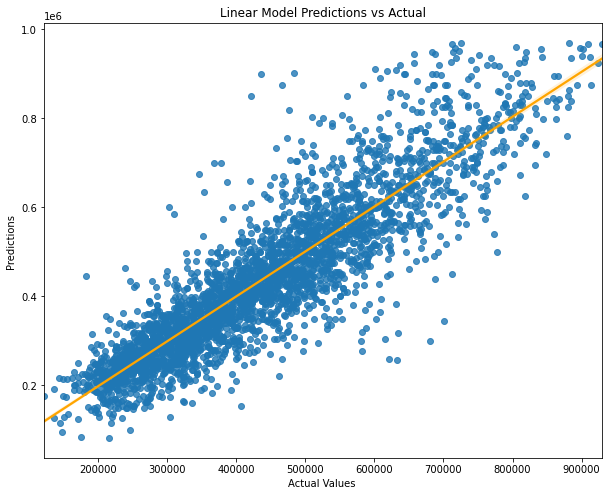

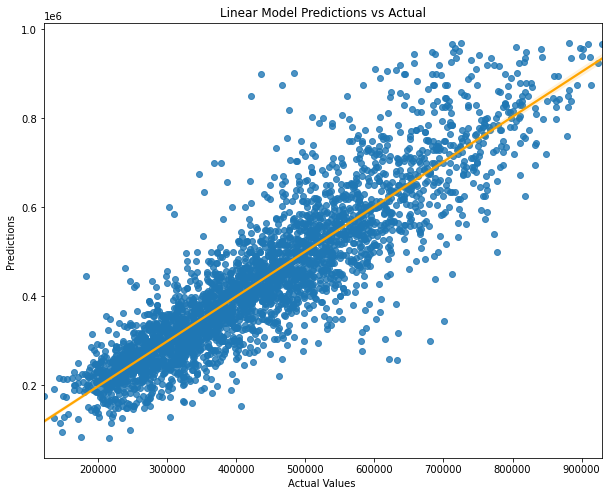

(XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None),
 XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=

In [62]:
funky_function4_1_4(data_to_test3_2, model_list)

In [64]:
import xgboost as xgb
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import mean_squared_error as MSE
scaler = StandardScaler()
   
X = pd.get_dummies(data_to_test.drop('price', axis=1))
y = data_to_test['price']

X_train, X_test, y_train_, y_test_ = train_test_split(X, y, test_size=0.25, random_state=42)

scaler.fit(X_train)
X_train_, X_test_ = (scaler.transform(X_train), scaler.transform(X_test))

xgb_model2 = XGBRegressor(n_estimators=1000)
xgb_model2.fit(X_train_, y_train_, early_stopping_rounds=5, 
             eval_set=[(X_test_, y_test_)], verbose=False)
y_train_pred2 = xgb_model2.predict(X_train_)
y_pred2 = xgb_model2.predict(X_test_)

print('Train r2 score: ', r2_score(y_train_pred2, y_train_))
print('Test r2 score: ', r2_score(y_test_, y_pred2))
train_mse2 = mean_squared_error(y_train_pred2, y_train_)
test_mse2 = mean_squared_error(y_pred2, y_test_)
train_rmse2 = np.sqrt(train_mse2)
test_rmse2 = np.sqrt(test_mse2)
print('Train RMSE: %.4f' % train_rmse2)
print('Test RMSE: %.4f' % test_rmse2)

Train r2 score:  0.8979055023033607
Test r2 score:  0.8301216133138727
Train RMSE: 53904.1814
Test RMSE: 72611.2719


In [68]:
import xgboost as xgb
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import mean_squared_error as MSE
scaler = StandardScaler()
   
X = pd.get_dummies(data_to_test3_1.drop('price', axis=1))
y = data_to_test3_1['price']

X_train, X_test, y_train_, y_test_ = train_test_split(X, y, test_size=0.25, random_state=42)

scaler.fit(X_train)
X_train_, X_test_ = (scaler.transform(X_train), scaler.transform(X_test))

xgb_model2 = XGBRegressor(n_estimators=1000)
xgb_model2.fit(X_train_, y_train_, early_stopping_rounds=5, 
             eval_set=[(X_test_, y_test_)], verbose=False)
y_train_pred2 = xgb_model2.predict(X_train_)
y_pred2 = xgb_model2.predict(X_test_)

print('Train r2 score: ', r2_score(y_train_pred2, y_train_))
print('Test r2 score: ', r2_score(y_test_, y_pred2))
train_mse2 = mean_squared_error(y_train_pred2, y_train_)
test_mse2 = mean_squared_error(y_pred2, y_test_)
train_rmse2 = np.sqrt(train_mse2)
test_rmse2 = np.sqrt(test_mse2)
train_mae = mean_absolute_error(y_train_pred2, y_train_)
test_mae = mean_absolute_error(y_pred2, y_test_)
print('Train RMSE: %.4f' % train_rmse2)
print('Test RMSE: %.4f' % test_rmse2)
print('Train MAE: %.4f' % train_mae)
print('Test MAE: %.4f' % test_mae)

Train r2 score:  0.9206949445442489
Test r2 score:  0.8377675407078605
Train RMSE: 47895.7858
Test RMSE: 70958.4068
Train MAE: 34401.4377
Test MAE: 49872.4300
